# Módulo  - Estatística II - Let's Code

## Projeto - Análise do dataset "Wine Quality"

<br>

![alt text](https://img.freepik.com/free-photo/front-view-wine-glasses-fresh-grapes-walnuts-yellow-cheese-wood-board-overturned-bottle-dark-background_140725-144998.jpg?w=740&t=st=1651080843~exp=1651081443~hmac=7951c45e0487804d22d080d58a44bb2cc662b5bd07f7a4e7f077ca79a7a5a09f)

---

__Professor:__ 

Sandro Saorim da Silva

---

__Participantes do projeto:__

Ana Paula <br>
Maeba Tomaselli <br>
Nicolas

---

Imagens e ícones externos: https://www.freepik.com/

___

### Instruções

- O projeto deverá ser entregue até dia 05/05;
- O projeto poderá ser feito __individualmente__ ou em __grupos__ de até __4 pessoas__;

### Informações sobre o projeto

Dataset (conjunto de dados a ser utilizado) está disponível em:
    https://archive.ics.uci.edu/ml/datasets/Wine+Quality

Data Set Information:

The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine. For more details, consult: [Web Link] or the reference [Cortez et al., 2009]. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

These datasets can be viewed as classification or regression tasks. The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent or poor wines. Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.


Attribute Information:

Input variables (based on physicochemical tests): <br>
- 1 - fixed acidity
- 2 - volatile acidity
- 3 - citric acid
- 4 - residual sugar
- 5 - chlorides
- 6 - free sulfur dioxide
- 7 - total sulfur dioxide
- 8 - density
- 9 - pH
- 10 - sulphates
- 11 - alcohol

Output variable (based on sensory data): <br>
- 12 - quality (score between 0 and 10)

Para ajudar no desenvolvimento do projeto, vamos separar o projeto em algumas seções, conforme descritas a seguir:

- __Preparação dos Dados e Verificação de Consistência__: Neste tópico deve ser feita a verificação da consistência dos dados e caso necessário efetuar eventuais modificações na base de dados. Alguns dos procedimentos que podemos fazer aqui são: Remoção e/ou tratamento de valores faltantes, remoção de duplicatas, ajustes dos tipos de variáveis, análise de _outliers_ entre outras;

<br>

- __Análise Exploratória dos Dados__: Para fazermos a modelagem, precisamos conhecer muito bem os dados que estamos trabalhando. Por isso, nesta parte do projeto vocês desenvolveram an´laises e gráficos a respeito dos dados que estão utilizando. Tente tirar ao máximo informações sobre as variáveis em si e suas relações com as demais;

<br>

- __Modelagem dos Dados__: Nesta parte, o projeto será dividido em dois modelos, um de Regressão Linear e outra de Regressão Logística. No __primeiro módulo__, o objetivo será modelar um regressor que estime o valor da qualidade do vinho (para este primeiro modelo, desconsidere a variável `quality`). No __segundo modelo__, utilizando como variável resposta (_target_) a variável `quality`, modelar um classificador que separe entre vinhos bons e ruins (para isto, considere `quality` >= 6 como um vinho bom). Além disso, avaliar a necessidade ou não de aplicar regularizações no modelo.

<br>

- __Conclusões sobre o Projeto__: Para finalizar, descreva as suas conclusões sobre o desenvolvimento do modelo e os resultados obtidos.

<br>

__Importante:__ Façam as análise em ambas as bases `winequality-red.csv` e `winequality-white.csv` separadamente, e depois misturem os dados para uma nova análise (no total serão 3 análises a serem feitas).

<br>

A entrega deve ser feita em um arquivo _Jupyter Notebook_ em aba que será disponibilizada no Class, contendo todo o desenvolvimento do projeto e o nome(s) do(s) aluno(s).

In [1324]:
#Importação das bibliotecas

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, classification_report, mean_squared_error, mean_absolute_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from mlxtend.plotting import plot_confusion_matrix

# desabilita os warnings
# import warnings
# warnings.filterwarnings('ignore')

---

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1113/1113714.png?w=740&t=st=1651079223~exp=1651079823~hmac=8b6fbaa53afbfc14dc61701c98a2ff1810fcca43c1824ccd757f1600c053abbe" width="30">
    <font size="+3.5">Análise do dataset de Vinhos Tintos</font>
</div>

In [474]:
# Importe dos dados pelo CSV
wine_red = pd.read_csv('./datasets/winequality-red.csv', sep=';')

Olhando para os dados:

In [475]:
wine_red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [279]:
# Verificando o shape dos dados
wine_red.shape

(1599, 12)

In [280]:
#Calcular as frequências das notas
wine_red['quality'].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

In [281]:
wine_red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


Todas as colunas são numéricas.

<br>

### Preparação dos Dados e Verificação de Consistência

__Verificação de dados faltantes__

In [284]:
#Verificação da existência de dados nulos no dataset
wine_red.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [285]:
#Verificando os dados zerados
wine_red[wine_red == 0].count()

fixed acidity             0
volatile acidity          0
citric acid             132
residual sugar            0
chlorides                 0
free sulfur dioxide       0
total sulfur dioxide      0
density                   0
pH                        0
sulphates                 0
alcohol                   0
quality                   0
dtype: int64

In [286]:
#Temos 132 valores zerados para o ácido cítrico num total de 1599 registros, resultando em 8,3% dos dados
132/1599*100

8.25515947467167

Não encontramos indícios de que os valores para a característica de ácido cítrico não podem ser zerados. Algumas fontes citam baixa quantidade de ácido cítrico no vinho, portanto estes registros zerados serão mantidos nas análises. 
* https://www.scielo.br/j/qn/a/xLDGdK6wsQTKNs8YsrT3ZLh/?format=pdf&lang=pt
* https://blog.famigliavalduga.com.br/qual-a-importancia-da-acidez-no-vinho/
* https://www.revistadevinhos.pt/beber/acidez-da-frescura-do-sabor-a-outras-dicas

<br>

__Análise de dados duplicados__

In [288]:
#Contagem dos dados duplicados
wine_red.duplicated().value_counts()

False    1359
True      240
dtype: int64

Os dados duplicados provavelmente são resultados de um mesmo vinho ou duplicação de informação. Consideramos que as variáveis possuem um valor contínuo e que possivelmente teríamos variações, mesmo que pequenas, nos resultados das análises químicas. Dessa forma optamos por manter somente um registro quando encontrarmos outros que repetem todas as variáveis.

In [476]:
#Copiando o dataset original para trabalhar os dados
wine_red_trat = wine_red.copy()

#Remoção dos dados duplicados
wine_red_trat.drop_duplicates(inplace=True)

#Checagem se os dados duplicados foram removidos
wine_red_trat.duplicated().sum()

0

In [477]:
#Checagem do tamanho do dataset após remoção dos duplicados - Redução dos dados de 1599 para 1359 (240 dados duplicados foram removidos)
wine_red_trat.shape

(1359, 12)

<br>

__Análise de outliers__

* Fixed acidity

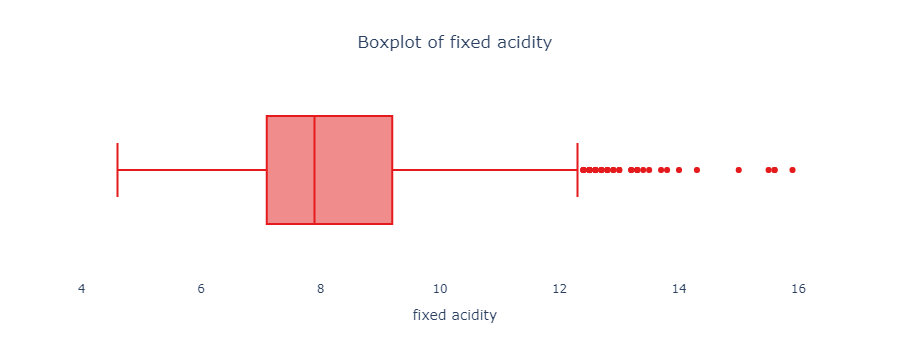

In [298]:
#Verificação de outliers para 'fixed acidity'
fig = px.box(wine_red_trat, x='fixed acidity', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of fixed acidity",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [299]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['fixed acidity'] > 12.3].count()[0]

41

Para os ácidos fixos (aqueles que não são capazes de volatilazação), os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (41) superiores ao limite máximo com valor de 12.3. Preferível manter todos os dados numa primeira análise.

* Volatile acidity

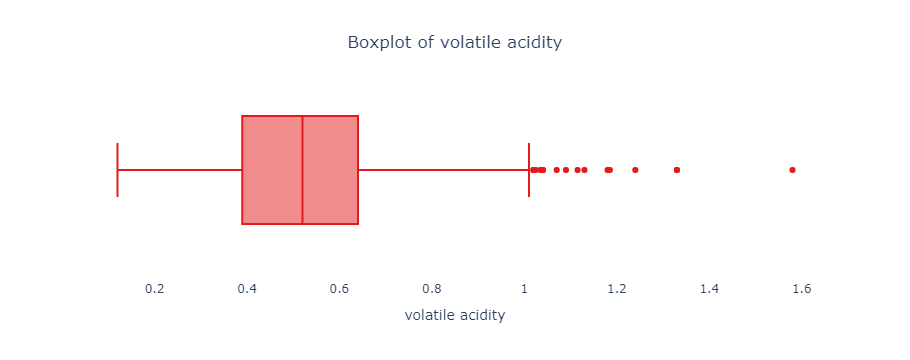

In [300]:
#Verificação de outliers para 'volatile acidity'
fig = px.box(wine_red_trat, x='volatile acidity', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of volatile acidity",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [301]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['volatile acidity'] > 1.01].count()[1]

19

Para os ácidos voláteis, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (19) superiores ao limite máximo com valor de 1.01. Preferível manter todos os dados numa primeira análise.

* Citric acid

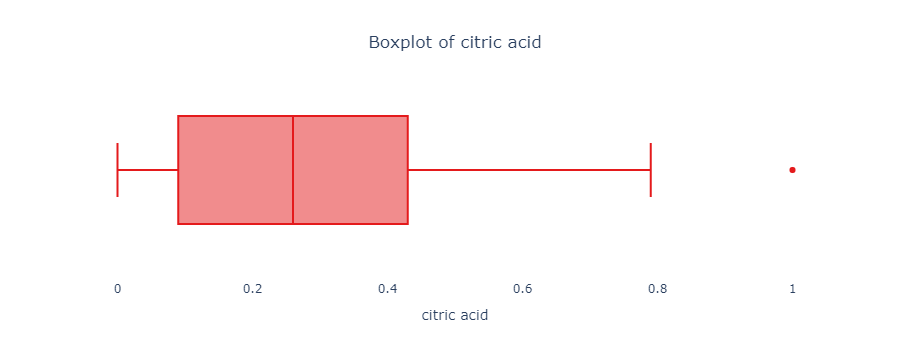

In [302]:
#Verificação de outliers para 'citric acid'
fig = px.box(wine_red_trat, x='citric acid', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of citric acid",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [303]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['citric acid'] > 0.79].count()[1]

1

Apenas um valor considerado como outlier para o ácido cítrico e que não está muito distante dos demais pontos. Será mantido numa primeira análise.

* Residual sugar

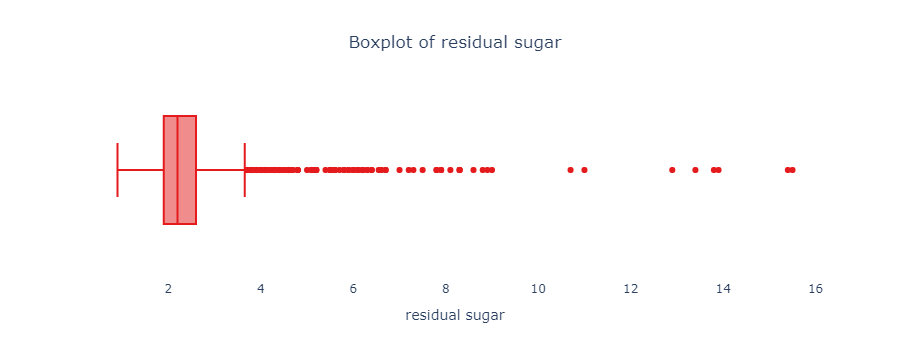

In [304]:
#Verificação de outliers para 'residual sugar'
fig = px.box(wine_red_trat, x='residual sugar', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of residual sugar",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [305]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['residual sugar'] > 3.65].count()[1]

126

* Chlorides

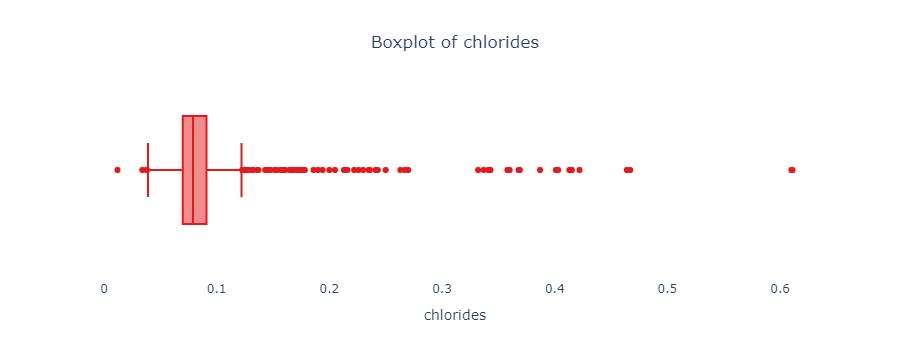

In [306]:
#Verificação de outliers para 'chlorides'
fig = px.box(wine_red_trat, x='chlorides', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of chlorides",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [307]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['chlorides'] > 0.122].count()[1]

83

In [308]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['chlorides'] < 0.039].count()[1]

4

* Free sulfur dioxide

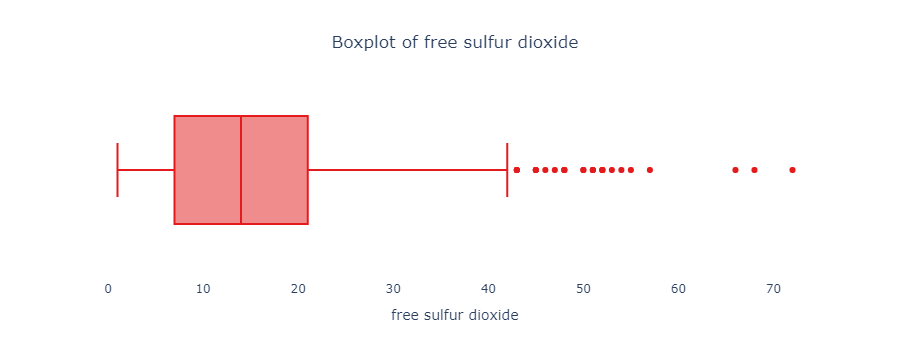

In [309]:
#Verificação de outliers para 'free sulfur dioxide'
fig = px.box(wine_red_trat, x='free sulfur dioxide', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of free sulfur dioxide",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [310]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['free sulfur dioxide'] > 42].count()[1]

26

Para dióxido de enxofre livre, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (26) superiores ao limite máximo com valor de 42. Preferível manter todos os dados numa primeira análise.

* Total sulfur dioxide

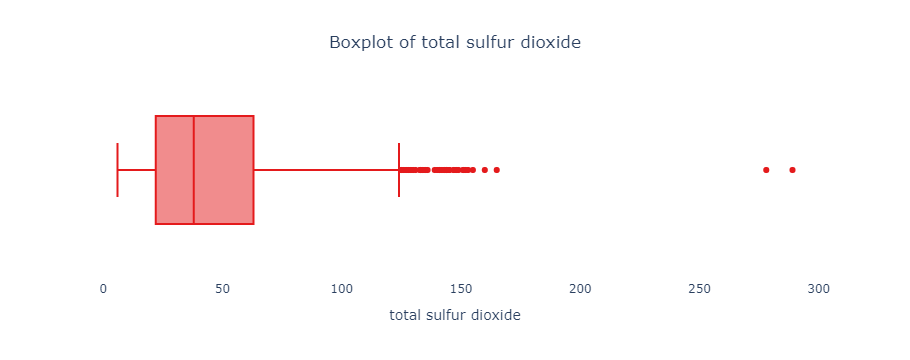

In [311]:
#Verificação de outliers para 'total sulfur dioxide'
fig = px.box(wine_red_trat, x='total sulfur dioxide', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of total sulfur dioxide",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [312]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['total sulfur dioxide'] > 124].count()[1]

45

In [313]:
#Contagem dos resultados mais afastados da concentração dos dados
wine_red_trat[wine_red_trat['total sulfur dioxide'] > 200].count()[1]

2

Para residual sugar, chlorides, free sulfur dioxide os valores considerados outliers aparentemente são valores distintos, mas possíveis para o vinho. Para o total sulfur dioxide existem valores considerados outliers acima de aproximadamente 124, mas existem também 2 pontos isolados acima de 200. Estes dois últimos parecem resultados um pouco diferentes dos demais, mas não iremos tirar da análise num primeiro momento porque podem ser números possíveis.

* Density

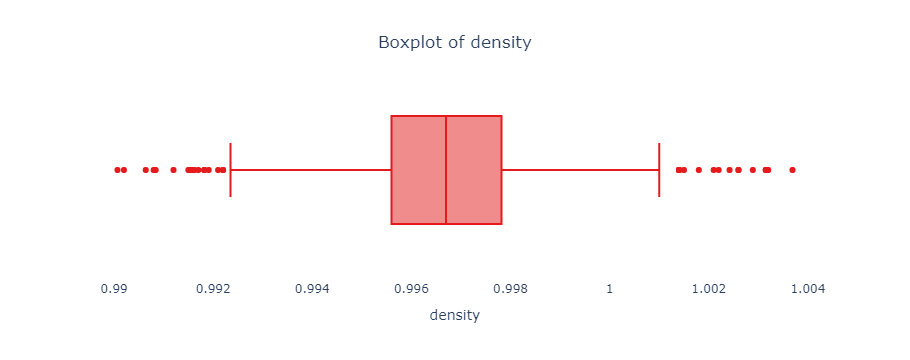

In [320]:
#Verificação de outliers para 'density'
fig = px.box(wine_red_trat, x='density', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of density",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [321]:
#Avaliando quantos valores temos como outliers no boxplot
wine_red_trat[wine_red_trat['density'] > 1.001].count()[1]

17

In [322]:
#Avaliando quantos valores temos como outliers no boxplot abaixo do limite mínimo
wine_red_trat[wine_red_trat['density'] < 0.99235].count()[1]

18

* pH

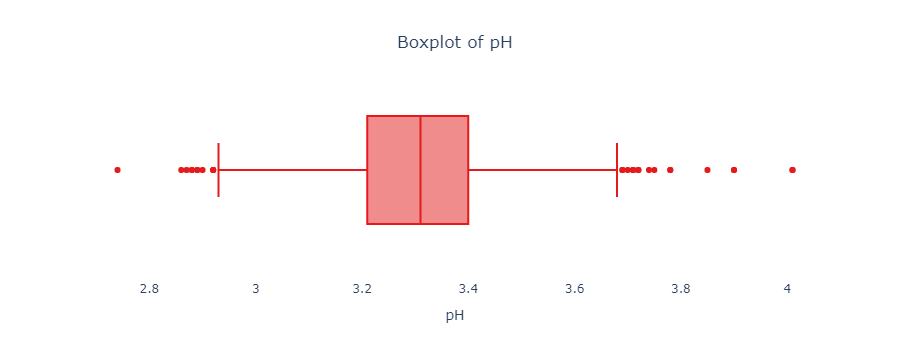

In [323]:
#Verificação de outliers para 'pH'
fig = px.box(wine_red_trat, x='pH', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of pH",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [324]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['pH'] > 3.68].count()[1]

17

In [325]:
#Contagem da quantidade de outliers a partir da visualização gráfica para valores abaixo do mínimo
wine_red_trat[wine_red_trat['pH'] < 2.93].count()[1]

11

Os valores de pH indicados como outliers estão ligeiramente distantes do restante dos registros, mas são resultados possíveis e serão mantidos.

* Sulphates

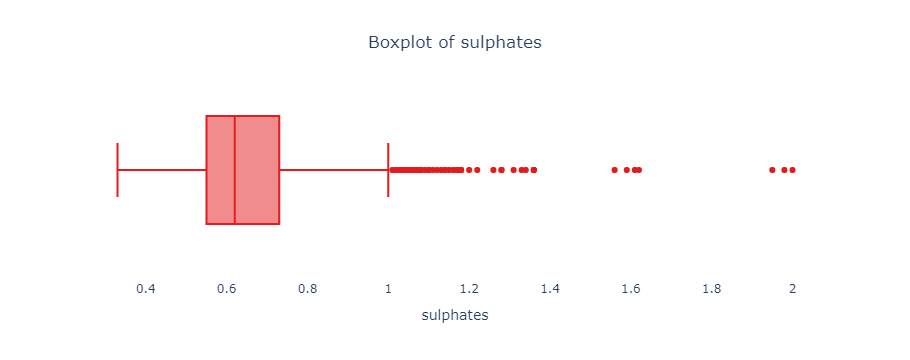

In [326]:
#Verificação de outliers para 'sulphates'
fig = px.box(wine_red_trat, x='sulphates', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of sulphates",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [327]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_red_trat[wine_red_trat['sulphates'] > 1].count()[1]

54

Os valores de sulphates indicados como outliers não estão muito distantes dos demais valores e aparentam ser valores possíveis para o vinho.

* Alcohol

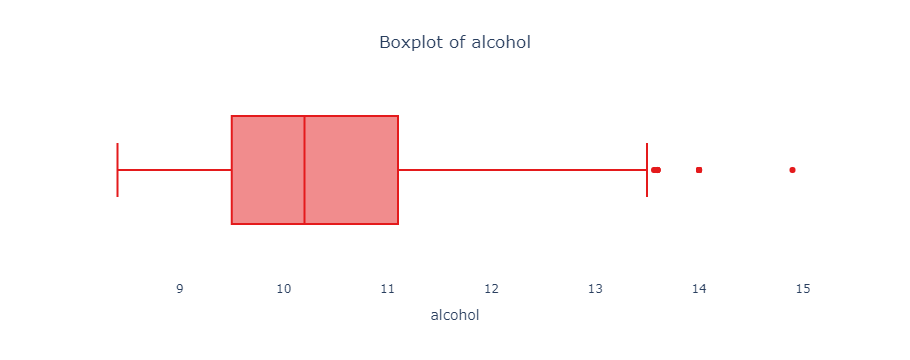

In [328]:
#Verificação de outliers para 'alcohol'
fig = px.box(wine_red_trat, x='alcohol', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    title={
        'text': "Boxplot of alcohol",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [329]:
#Avaliando quantos valores temos como outliers no boxplot
#Os valores negativos representam os dados incorretos que foram tratados
wine_red_trat[wine_red_trat['alcohol'] > 13.5].count()[1]

12

<br>

__Preparando os dados para uma segunda análise através da avaliação dos outliers__

Estratégia utilizada: avaliar quantos atributos são outliers para um mesmo registro, caso exista um número grande de outliers num mesmo registro, faremos a remoção da linha. <br>
Além da observação gráfica das variáveis nos box plots, também foi utilizado o z-score. Para este último foram considerados valores acima de +/- 3 desvios-padrão (99,7% dos dados) para detecção dos outliers.

In [967]:
#Cálculo do Z-Score para cada atributo
z_fixed_acidity = np.abs(stats.zscore(wine_red_trat['fixed acidity']))
z_volatile_acidity = np.abs(stats.zscore(wine_red_trat['volatile acidity']))
z_citric_acid = np.abs(stats.zscore(wine_red_trat['citric acid']))
z_residual_sugar = np.abs(stats.zscore(wine_red_trat['residual sugar']))
z_chlorides = np.abs(stats.zscore(wine_red_trat['chlorides']))
z_free_sulfur_dioxide = np.abs(stats.zscore(wine_red_trat['free sulfur dioxide']))
z_total_sulfur_dioxide = np.abs(stats.zscore(wine_red_trat['total sulfur dioxide']))
z_density = np.abs(stats.zscore(wine_red_trat['density']))
z_pH = np.abs(stats.zscore(wine_red_trat['pH']))
z_sulphates = np.abs(stats.zscore(wine_red_trat['sulphates']))
z_alcohol = np.abs(stats.zscore(wine_red_trat['alcohol']))

In [968]:
#Pegando a posição de cada outlier (np.where para valores +/- 3 desvios-padrão) e montando um array com as posições encontradas para cada atributo
outlier_fixed_acidity = np.where(z_fixed_acidity > 3)[0] #[0] para pegar o primeiro elemento da tupla (formada no np.where) e facilitar no momento da concatenação (célula abaixo)
outlier_volatile_acidity = np.where(z_volatile_acidity > 3)[0]
outlier_citric_acid = np.where(z_citric_acid > 3)[0]
outlier_residual_sugar = np.where(z_residual_sugar > 3)[0]
outlier_chlorides = np.where(z_chlorides > 3)[0]
outlier_free_sulfur_dioxide = np.where(z_free_sulfur_dioxide > 3)[0]
outlier_total_sulfur_dioxide = np.where(z_total_sulfur_dioxide > 3)[0]
outlier_density = np.where(z_density > 3)[0]
outlier_pH = np.where(z_pH > 3)[0]
outlier_sulphates = np.where(z_sulphates > 3)[0]
outlier_alcohol = np.where(z_alcohol > 3)[0]

In [969]:
#Concatenando as posições dos registros com outliers para encontrar aqueles que aparecem mais de uma vez
array_outliers = np.concatenate((outlier_fixed_acidity, 
                                 outlier_volatile_acidity,
                                 outlier_citric_acid,
                                 outlier_residual_sugar, 
                                 outlier_chlorides, 
                                 outlier_free_sulfur_dioxide, 
                                 outlier_total_sulfur_dioxide, 
                                 outlier_density, 
                                 outlier_pH, 
                                 outlier_sulphates,
                                 outlier_alcohol)) #Necessário colocar dois parênteses para corrigir o problema, apenas um não funciona
len(array_outliers)

153

In [970]:
len(np.unique(array_outliers))

120

In [1055]:
array_outliers

array([ 214,  302,  328,  334,  385,  473,  483,  485,  565,   35,  114,
        115,  176,  582,  597,  627, 1106, 1117,  135,   30,  144,  145,
        241,  282,  346,  361,  363,  420,  433,  516,  562,  565,  764,
        781,  786,  888,  912,  918,  920, 1013, 1052, 1060, 1216, 1250,
       1325, 1336, 1350,   15,   17,   38,   75,   77,   96,  135,  150,
        159,  202,  211,  226,  245,  252,  393,  492,  599,  632,  652,
        671,  672,  895,  994, 1073, 1123, 1162, 1165,   12,   13,   53,
        346,  506,  791,  792,  838,  963,  985, 1003, 1049, 1060, 1103,
       1151, 1216, 1250, 1325,   13,   99,  309,  448,  513,  562,  564,
        582,  592,  918,  920, 1060,  385,  420,  483,  485,  528,  722,
        764,  866,  948, 1081, 1082, 1216, 1250,   41,   87,  135,  602,
        945, 1107, 1121, 1125,   11,   15,   39,   75,   80,   82,   85,
         96,  135,  150,  202,  226,  295,  296,  534,  555,  626,  687,
        895, 1123, 1159,  127,  408,  510,  565,  7

Temos 120 números únicos, o que significa que alguns índices aparecem mais de uma vez e, portanto, são registros que possuem mais de um outlier

In [971]:
#Ordenando o array de outliers
array_outliers_ord = np.sort(array_outliers)

In [972]:
#Etapa para montar um array com os valores duplicados
unicos = []
duplicados = []

for x in array_outliers_ord:
    if x in unicos:
        duplicados.append(x)
    else:
        unicos.append(x)

In [973]:
print(unicos)

[11, 12, 13, 15, 17, 30, 35, 38, 39, 41, 53, 75, 77, 80, 82, 85, 87, 96, 99, 114, 115, 127, 135, 144, 145, 150, 159, 176, 202, 211, 214, 226, 241, 245, 252, 282, 295, 296, 302, 309, 328, 334, 346, 361, 363, 385, 393, 408, 420, 433, 448, 473, 483, 485, 492, 506, 510, 513, 516, 528, 534, 555, 562, 564, 565, 582, 592, 597, 599, 602, 626, 627, 632, 652, 671, 672, 687, 710, 722, 764, 781, 786, 791, 792, 838, 866, 888, 895, 912, 918, 920, 945, 948, 963, 985, 994, 1003, 1013, 1049, 1052, 1060, 1073, 1081, 1082, 1103, 1106, 1107, 1117, 1121, 1123, 1125, 1151, 1159, 1162, 1165, 1216, 1250, 1325, 1336, 1350]


In [1075]:
outlier_pH

array([  41,   87,  135,  602,  945, 1107, 1121, 1125], dtype=int64)

In [974]:
sorted(duplicados)

[13,
 15,
 75,
 96,
 135,
 135,
 135,
 150,
 202,
 226,
 346,
 385,
 420,
 483,
 485,
 562,
 565,
 565,
 582,
 764,
 895,
 918,
 920,
 1060,
 1060,
 1081,
 1082,
 1123,
 1216,
 1216,
 1250,
 1250,
 1325]

In [338]:
wine_red_trat.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [339]:
#Encontrando os limites superiores e inferiores para cada variável

#fixed_acidity
upper_limit_fixed_acidity_z = wine_red_trat['fixed acidity'].mean() + 3*wine_red_trat['fixed acidity'].std()
lower_limit_fixed_acidity_z = wine_red_trat['fixed acidity'].mean() - 3*wine_red_trat['fixed acidity'].std()

#volatile acidity
upper_limit_volatile_acidity_z = wine_red_trat['volatile acidity'].mean() + 3*wine_red_trat['volatile acidity'].std()
lower_limit_volatile_acidity_z = wine_red_trat['volatile acidity'].mean() - 3*wine_red_trat['volatile acidity'].std()

#citric acid
upper_limit_citric_acid_z = wine_red_trat['citric acid'].mean() + 3*wine_red_trat['citric acid'].std()
lower_limit_citric_acid_z = wine_red_trat['citric acid'].mean() - 3*wine_red_trat['citric acid'].std()


#residual sugar
upper_limit_residual_sugar_z = wine_red_trat['residual sugar'].mean() + 3*wine_red_trat['residual sugar'].std()
lower_limit_residual_sugar_z = wine_red_trat['residual sugar'].mean() - 3*wine_red_trat['residual sugar'].std()


#chlorides
upper_limit_chlorides_z = wine_red_trat['chlorides'].mean() + 3*wine_red_trat['chlorides'].std()
lower_limit_chlorides_z = wine_red_trat['chlorides'].mean() - 3*wine_red_trat['chlorides'].std()


#free sulfur dioxide  
upper_limit_free_sulfur_dioxide_z = wine_red_trat['free sulfur dioxide'].mean() + 3*wine_red_trat['free sulfur dioxide'].std()
lower_limit_free_sulfur_dioxide_z = wine_red_trat['free sulfur dioxide'].mean() - 3*wine_red_trat['free sulfur dioxide'].std()


#total sulfur dioxide 
upper_limit_total_sulfur_dioxide_z = wine_red_trat['total sulfur dioxide'].mean() + 3*wine_red_trat['total sulfur dioxide'].std()
lower_limit_total_sulfur_dioxide_z = wine_red_trat['total sulfur dioxide'].mean() - 3*wine_red_trat['total sulfur dioxide'].std()

#density'
upper_limit_density_z = wine_red_trat['density'].mean() + 3*wine_red_trat['density'].std()
lower_limit_density_z = wine_red_trat['density'].mean() - 3*wine_red_trat['density'].std()

#pH
upper_limit_pH_z = wine_red_trat['pH'].mean() + 3*wine_red_trat['pH'].std()
lower_limit_pH_z = wine_red_trat['pH'].mean() - 3*wine_red_trat['pH'].std()

#sulphates
upper_limit_sulphates_z = wine_red_trat['sulphates'].mean() + 3*wine_red_trat['sulphates'].std()
lower_limit_sulphates_z = wine_red_trat['sulphates'].mean() - 3*wine_red_trat['sulphates'].std()

#alcohol
upper_limit_alcohol_z = wine_red_trat['alcohol'].mean() + 3*wine_red_trat['alcohol'].std()
lower_limit_alcohol_z = wine_red_trat['alcohol'].mean() - 3*wine_red_trat['alcohol'].std()

In [341]:
#Comparando os outliers avaliados graficamente a partir do box plot e dos outliers calculados a partir do z-score

#Outliers observados nos gráficos de cada variável
upper_limit_fixed_acidity_box = 12.3
lower_limit_fixed_acidity_box = 4.6
upper_limit_volatile_acidity_box = 1.01
lower_limit_volatile_acidity_box = 0.12
upper_limit_citric_acid_box = 0.79
lower_limit_citric_acid_box = 0
upper_limit_residual_sugar_box = 3.65
lower_limit_residual_sugar_box = 0.9
upper_limit_chlorides_box = 0.122
lower_limit_chlorides_box = 0.039
upper_limit_free_sulfur_dioxide_box = 42
lower_limit_free_sulfur_dioxide_box = 1
upper_limit_total_sulfur_dioxide_box = 124
lower_limit_total_sulfur_dioxide_box = 6
upper_limit_density_box = 1.001
lower_limit_density_box = 0.99235
upper_limit_pH_box = 3.68
lower_limit_pH_box = 2.93
upper_limit_sulphates_box = 1
lower_limit_sulphates_box = 0.33
upper_limit_alcohol_box = 13.5
lower_limit_alcohol_box = 8.4


#Montando dicinaários dos outliers calculados a partir do z-score e do box
dict_outliers = {'outliers_z': [upper_limit_fixed_acidity_z,
                   lower_limit_fixed_acidity_z,
                   upper_limit_volatile_acidity_z,
                   lower_limit_volatile_acidity_z,
                   upper_limit_citric_acid_z,
                   lower_limit_citric_acid_z,
                   upper_limit_residual_sugar_z,
                   lower_limit_residual_sugar_z,
                   upper_limit_chlorides_z,
                   lower_limit_chlorides_z,
                   upper_limit_free_sulfur_dioxide_z,
                   lower_limit_free_sulfur_dioxide_z,
                   upper_limit_total_sulfur_dioxide_z,
                   lower_limit_total_sulfur_dioxide_z,
                   upper_limit_density_z,
                   lower_limit_density_z,
                   upper_limit_pH_z,
                   lower_limit_pH_z,
                   upper_limit_sulphates_z,
                   lower_limit_sulphates_z,
                   upper_limit_alcohol_z,
                   lower_limit_alcohol_z
                  ],
                  'outliers_box': [upper_limit_fixed_acidity_box,
                     lower_limit_fixed_acidity_box,
                     upper_limit_volatile_acidity_box,
                     lower_limit_volatile_acidity_box,
                     upper_limit_citric_acid_box,
                     lower_limit_citric_acid_box,
                     upper_limit_residual_sugar_box,
                     lower_limit_residual_sugar_box,
                     upper_limit_chlorides_box,
                     lower_limit_chlorides_box,
                     upper_limit_free_sulfur_dioxide_box,
                     lower_limit_free_sulfur_dioxide_box,
                     upper_limit_total_sulfur_dioxide_box,
                     lower_limit_total_sulfur_dioxide_box,
                     upper_limit_density_box,
                     lower_limit_density_box,
                     upper_limit_pH_box,
                     lower_limit_pH_box,
                     upper_limit_sulphates_box,
                     lower_limit_sulphates_box,
                     upper_limit_alcohol_box,
                     lower_limit_alcohol_box
                    ]}

#Montando uma lista com o nome das variáveis que serão o cabeçalho do dataframe
list_dfcolumns = ['upper_limit_fixed_acidity',
                  'lower_limit_fixed_acidity',
                  'upper_limit_volatile_acidity',
                  'lower_limit_volatile_acidity',
                  'upper_limit_citric_acid',
                  'lower_limit_citric_acid',
                  'upper_limit_residual_sugar',
                  'lower_limit_residual_sugar',
                  'upper_limit_chlorides',
                  'lower_limit_chlorides',
                  'upper_limit_free_sulfur_dioxide',
                  'lower_limit_free_sulfur_dioxide',
                  'upper_limit_total_sulfur_dioxide',
                  'lower_limit_total_sulfur_dioxide',
                  'upper_limit_density',
                  'lower_limit_density',
                  'upper_limit_pH',
                  'lower_limit_pH',
                  'upper_limit_sulphates',
                  'lower_limit_sulphates',
                  'upper_limit_alcohol',
                  'lower_limit_alcohol']

df_outliers_red_wine = pd.DataFrame(data = dict_outliers, index = list_dfcolumns)
df_outliers_red_wine

,outliers_z,outliers_box
upper_limit_fixed_acidity,13.521565,12.30000
lower_limit_fixed_acidity,3.099627,4.60000
upper_limit_volatile_acidity,1.078572,1.01000
lower_limit_volatile_acidity,-0.019616,0.12000
upper_limit_citric_acid,0.858942,0.79000
lower_limit_citric_acid,-0.314277,0.00000
upper_limit_residual_sugar,6.580341,3.65000
lower_limit_residual_sugar,-1.533542,0.90000
upper_limit_chlorides,0.236254,0.12200
lower_limit_chlorides,-0.060007,0.03900


__Outliers:__ A tabela acima resume os outliers calculados a partir do z-score e os observados no gráfico de cada variável.

In [1098]:
#Função para remover os registros que possuem mais de um outlier

def remove_outlier(outlier, df):

    #Criando uma cópia do dataset que estamos trabalhando
    df_outlier = df.copy()
    
    #Retirando os registros repetidos da lista
    outliers_remocao = np.unique(outlier)
    
    #Lista para armazenar os índices de cada registro
    list_index_outliers = []

    #Montando uma lista com os índices dos registros que contem mais de um outlier
    for i in outliers_remocao:
        list_index_outliers.append(df.iloc[[i]].index.tolist())

    for x in list_index_outliers:
        df_outlier.drop(x, inplace=True)
        
    return df_outlier

In [1102]:
wine_red_drop_outlier = remove_outlier(duplicados, wine_red_trat)

In [1106]:
#Comparando o tamanho do dataset original com o dataset sem os outliers selecionados
wine_red_trat.shape

(1359, 13)

In [1109]:
#Comparando o tamanho do dataset original com o dataset sem os outliers selecionados
wine_red_drop_outlier.shape

(1332, 13)

<br>

__Salvando os dados tratados em um csv e também os dados com os outliers removidos para outras análises__

In [953]:
#Salvando os dados tratados em um dataset
wine_red_trat.to_csv('./datasets/winequality-red_trat.csv', sep=',',index = True)

In [1110]:
#Salvando os dados com outliers selecionados removidos em um dataset
wine_red_drop_outlier.to_csv('./datasets/winequality-red_drop_outlier.csv', sep=',',index = True)

<br>

__Resumo da etapa de limpeza e verificação:__ 
* Exclusão dos dados duplicados - 1599 registros para 1359
* Demais atributos com valores indicados como outliers serão mantidos no dataset para uma primeira análise
* Criação de um dataset com os registros que possuem mais de um outlier para uma comparação de resultados dos modelos de regressão

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1215/1215931.png?w=740&t=st=1651688168~exp=1651688768~hmac=7275905f396cbefe0abef46fb49475b553b9b77001ade259c4766f033e301ffb" width="20">
    <font size="+2.5">Análise Exploratória dos Dados</font>
</div>

In [478]:
wine_red_trat.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065,0.823578
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


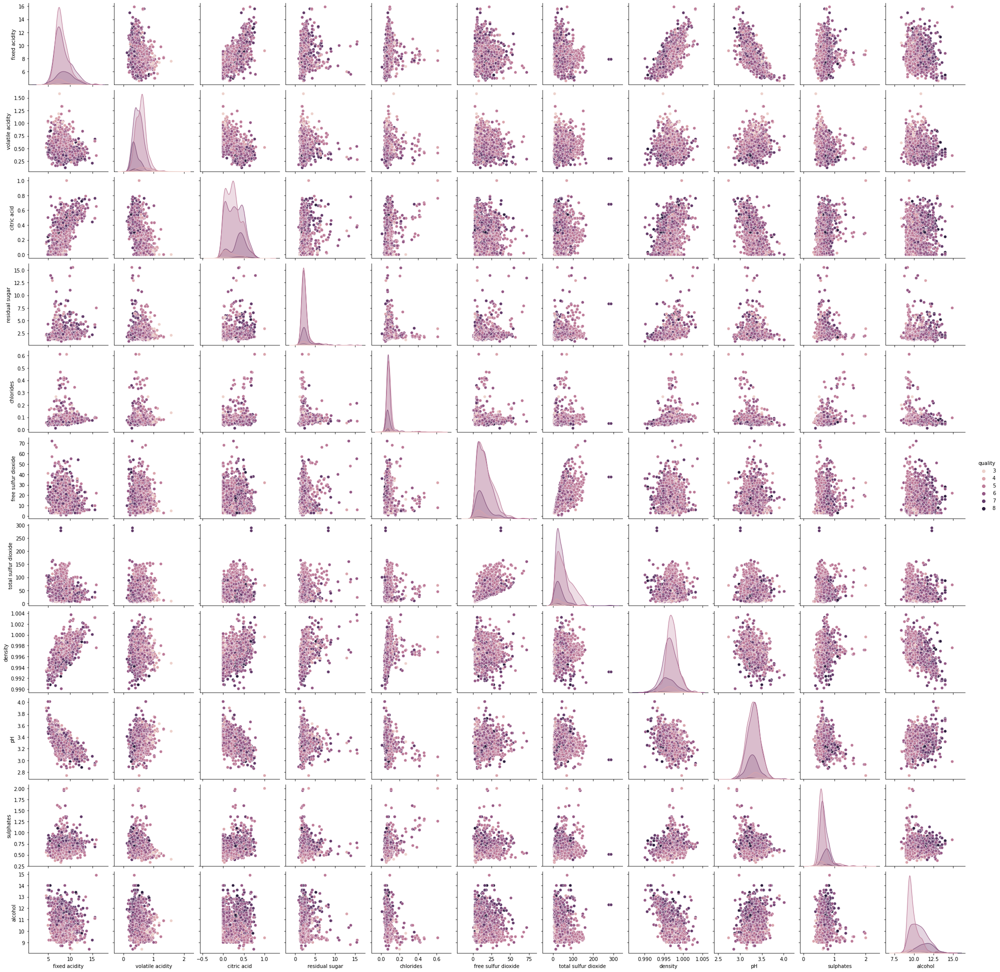

In [345]:
#Grade de gráfico com as relações entre variáveis
sns.pairplot(wine_red_trat, hue = 'quality') #overview dos dados
plt.show()

<br>

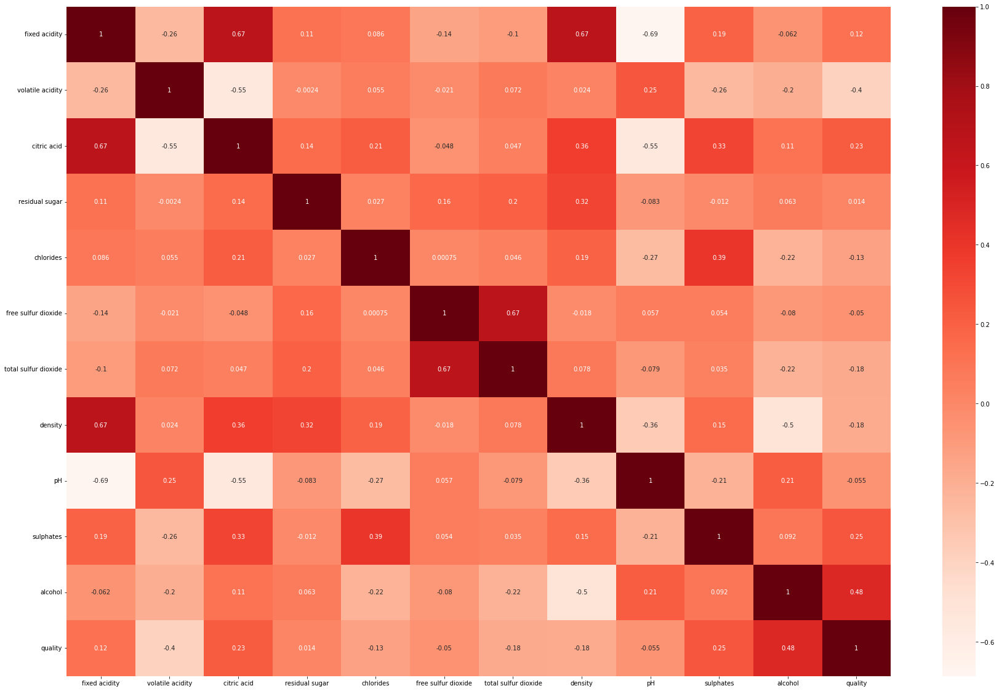

In [347]:
#Para verificar se há correlações entre as feautures e o target. Nele, 1 significa que há uma correlação positiva e -1 negativa.

plt.figure(figsize=(30,20))
cor = wine_red_trat.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

Em relação a qualidade, a variável com maior correlação no mapa de calor é:
- Álcool (0.480343)

Ainda em relação a qualidade, as variáveis com correlação de forma mais fraca:
- Sulfatos (0.248835)
- Ácido cítrico (0.228057)
- Acidez volátil (-0.395214)

Entre as variáveis do vinho tinto, as maiores correlações são:
- Acidez fixa e ácido cítrico (0.667437)
- Acidez fixa e densidade (0.670195)
- Dióxido de enxofre livre e total de dióxido de enxofre (0.667246)
- Ácido cítrico e acidez volátil (-0.551248)
- Acidez fixa e pH (-0.686685)
- Ácido cítrico e pH (-0.550310)
- Densidade e álcool (-0.504995)

In [736]:
df_red_corr = wine_red_trat.corr()
df_red_corr[df_red_corr>0.2]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,NaN,0.667437,NaN,NaN,NaN,NaN,0.670195,NaN,NaN,NaN,NaN
volatile acidity,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.247111,NaN,NaN,NaN
citric acid,0.667437,NaN,1.000000,NaN,0.210195,NaN,NaN,0.357962,NaN,0.326062,NaN,0.228057
residual sugar,NaN,NaN,NaN,1.000000,NaN,NaN,0.201038,0.324522,NaN,NaN,NaN,NaN
chlorides,NaN,NaN,0.210195,NaN,1.000000,NaN,NaN,NaN,NaN,0.394557,NaN,NaN
free sulfur dioxide,NaN,NaN,NaN,NaN,NaN,1.000000,0.667246,NaN,NaN,NaN,NaN,NaN
total sulfur dioxide,NaN,NaN,NaN,0.201038,NaN,0.667246,1.000000,NaN,NaN,NaN,NaN,NaN
density,0.670195,NaN,0.357962,0.324522,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN
pH,NaN,0.247111,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,0.213418,NaN
sulphates,NaN,NaN,0.326062,NaN,0.394557,NaN,NaN,NaN,NaN,1.000000,NaN,0.248835


In [738]:
df_red_corr = wine_red_trat.corr()
df_red_corr[df_red_corr<-0.2]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,NaN,-0.255124,NaN,NaN,NaN,NaN,NaN,NaN,-0.686685,NaN,NaN,NaN
volatile acidity,-0.255124,NaN,-0.551248,NaN,NaN,NaN,NaN,NaN,NaN,-0.256948,NaN,-0.395214
citric acid,NaN,-0.551248,NaN,NaN,NaN,NaN,NaN,NaN,-0.550310,NaN,NaN,NaN
residual sugar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
chlorides,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.270893,NaN,-0.223824,NaN
free sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
total sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.217829,NaN
density,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.355617,NaN,-0.504995,NaN
pH,-0.686685,NaN,-0.550310,NaN,-0.270893,NaN,NaN,-0.355617,NaN,-0.214134,NaN,NaN
sulphates,NaN,-0.256948,NaN,NaN,NaN,NaN,NaN,NaN,-0.214134,NaN,NaN,NaN


<br>

<AxesSubplot:xlabel='quality', ylabel='Count'>

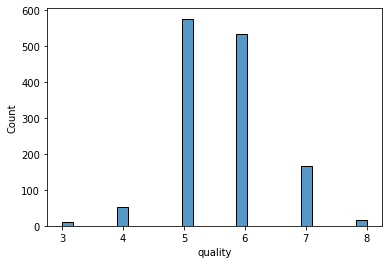

In [479]:
# histograma de quality ja possivel identificar que 5 e 6  tem um numero maior de amostras então o dataset
#esta desbalanceado isso prejudica a precisão da analise

sns.histplot(wine_red_trat['quality'])

In [480]:
wine_red_trat['quality'].value_counts(normalize = True)

5    0.424577
6    0.393672
7    0.122884
4    0.038999
8    0.012509
3    0.007358
Name: quality, dtype: float64

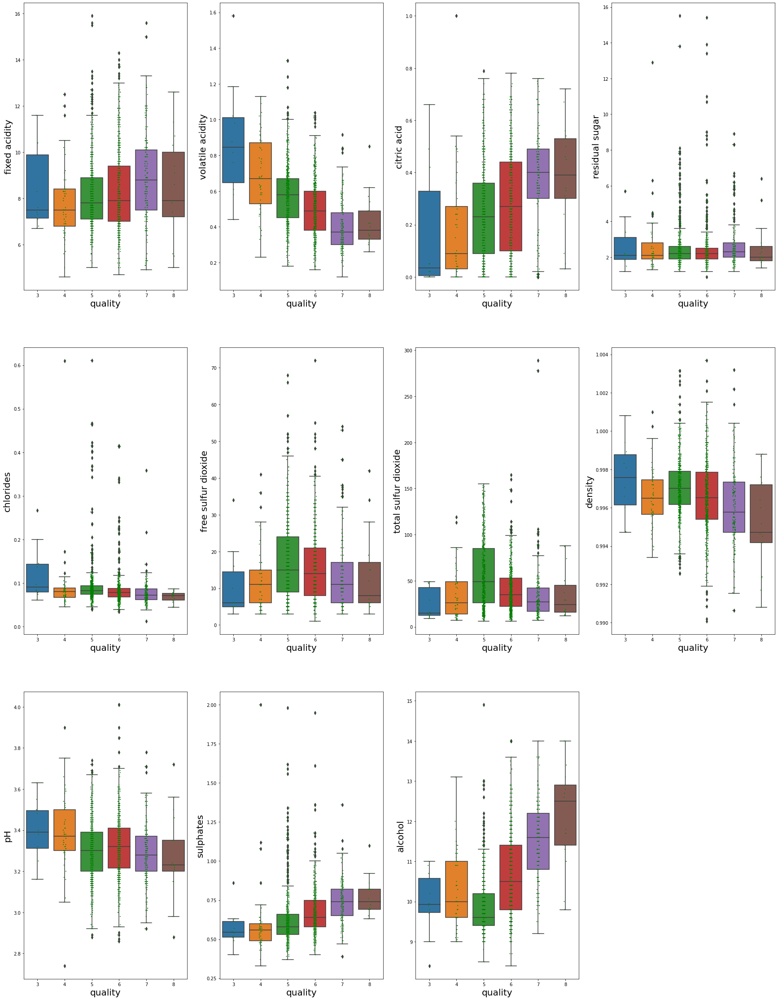

In [350]:
fig = plt.figure(figsize = (30,40)) # width x height
ax1 = fig.add_subplot(3, 4, 1) # row, column, position
ax2 = fig.add_subplot(3, 4, 2)
ax3 = fig.add_subplot(3, 4, 3)
ax4 = fig.add_subplot(3, 4, 4)
ax5 = fig.add_subplot(3, 4, 5)
ax6 = fig.add_subplot(3, 4, 6)
ax7 = fig.add_subplot(3, 4, 7)
ax8 = fig.add_subplot(3, 4, 8)
ax9 = fig.add_subplot(3, 4, 9)
ax10 = fig.add_subplot(3, 4, 10)
ax11 = fig.add_subplot(3, 4, 11)

sns.boxplot(x='quality', y=wine_red_trat['fixed acidity'], data=wine_red_trat, ax=ax1)
sns.stripplot(x='quality', y=wine_red_trat['fixed acidity'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax1)
ax1.xaxis.label.set_size(20)
ax1.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['volatile acidity'], data=wine_red_trat, ax=ax2)
sns.stripplot(x='quality', y=wine_red_trat['volatile acidity'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax2)
ax2.xaxis.label.set_size(20)
ax2.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['citric acid'], data=wine_red_trat, ax=ax3)
sns.stripplot(x='quality', y=wine_red_trat['citric acid'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax3)
ax3.xaxis.label.set_size(20)
ax3.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['residual sugar'], data=wine_red_trat, ax=ax4)
sns.stripplot(x='quality', y=wine_red_trat['residual sugar'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax4)
ax4.xaxis.label.set_size(20)
ax4.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['chlorides'], data=wine_red_trat, ax=ax5)
sns.stripplot(x='quality', y=wine_red_trat['chlorides'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax5)
ax5.xaxis.label.set_size(20)
ax5.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['free sulfur dioxide'], data=wine_red_trat, ax=ax6)
sns.stripplot(x='quality', y=wine_red_trat['free sulfur dioxide'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax6)
ax6.xaxis.label.set_size(20)
ax6.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['total sulfur dioxide'], data=wine_red_trat, ax=ax7)
sns.stripplot(x='quality', y=wine_red_trat['total sulfur dioxide'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax7)
ax7.xaxis.label.set_size(20)
ax7.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['density'], data=wine_red_trat, ax=ax8)
sns.stripplot(x='quality', y=wine_red_trat['density'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax8)
ax8.xaxis.label.set_size(20)
ax8.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['pH'], data=wine_red_trat, ax=ax9)
sns.stripplot(x='quality', y=wine_red_trat['pH'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax9)
ax9.xaxis.label.set_size(20)
ax9.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['sulphates'], data=wine_red_trat, ax=ax10)
sns.stripplot(x='quality', y=wine_red_trat['sulphates'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax10)
ax10.xaxis.label.set_size(20)
ax10.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_red_trat['alcohol'], data=wine_red_trat, ax=ax11)
sns.stripplot(x='quality', y=wine_red_trat['alcohol'], data=wine_red_trat, color="green", jitter=0.05, size=2, ax=ax11)
ax11.xaxis.label.set_size(20)
ax11.yaxis.label.set_size(20)

plt.savefig('boxplot_quality.png', format='png', dpi=100)

In [536]:
# vinho ruim (qualidade 0-5)
# bom vinho (qualidade 6-10)

group_quality = []

for k in wine_red_trat['quality']:
    if k >= 0 and k < 6:
        group_quality.append('Ruim')
    elif k >= 6:
        group_quality.append('Bom')
        
wine_red_trat['group_quality'] = group_quality

In [537]:
#Salvando os dados tratados em um dataset
wine_red_trat.to_csv('./datasets/winequality-red_trat_group_quality.csv', sep=',',index = True)

In [538]:
wine_red_trat.groupby('group_quality').count()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
group_quality,,,,,,,,,,,,
Bom,719,719,719,719,719,719,719,719,719,719,719,719
Ruim,640,640,640,640,640,640,640,640,640,640,640,640


<AxesSubplot:xlabel='group_quality', ylabel='count'>

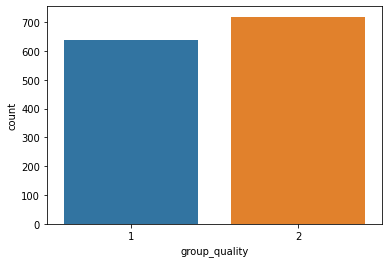

In [484]:
sns.countplot(x='group_quality', data=wine_red_trat)

In [501]:
wine_red_trat.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,group_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,2
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,1


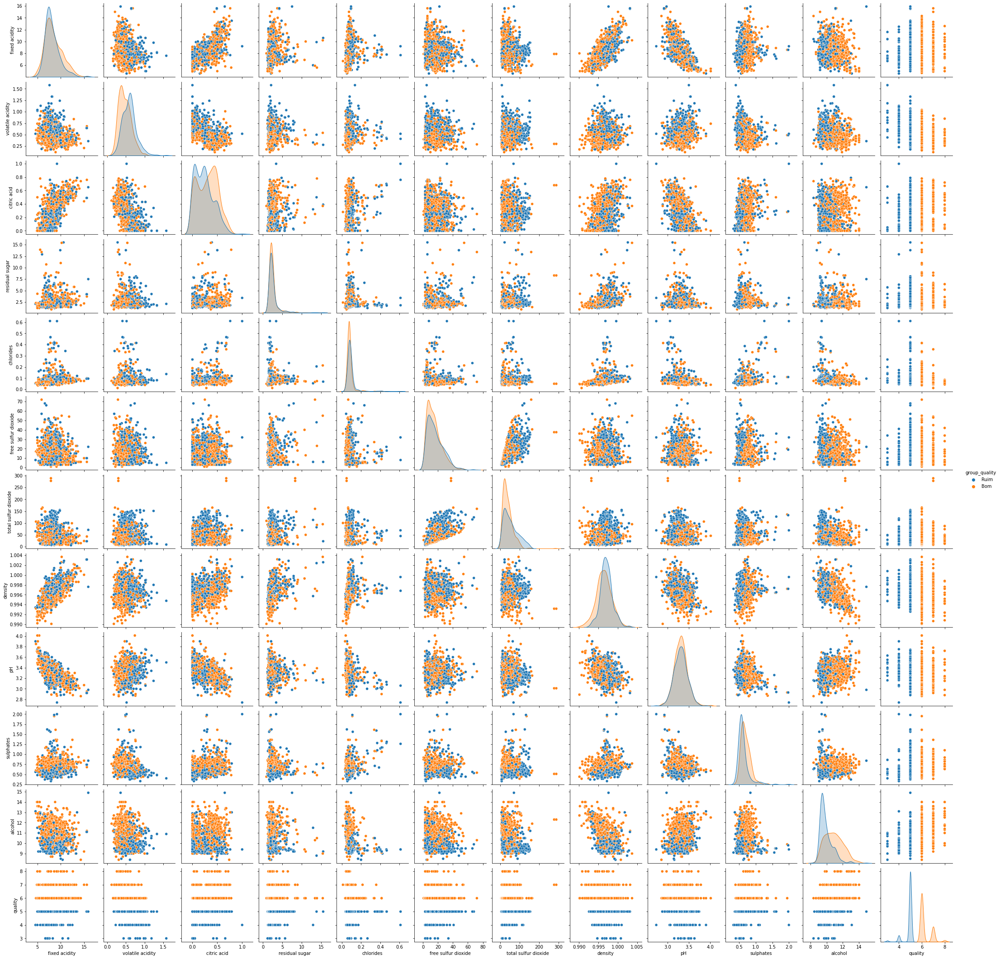

In [1111]:
sns.pairplot(wine_red_trat, hue = 'group_quality')

<br>

__Resumo da etapa de EDA para os vinhos tintos:__ 
* Maior concentração de notas 5 e 6;
* Nenhuma nota extremamente baixa ou muito alta;
* Correlações não aparentam ser muito lineares;
* Variável com maior correlação com a qualidade é o álcool;
* Sulfato e ácido cítrico podem influenciar a nota positivamente;
* Acidez volátil parece influenciar a nota negativamente.

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1255/1255990.png?w=740&t=st=1651687663~exp=1651688263~hmac=49e6725289d3e2aa6cb72e8ddad32f53197719c9bd8594cd72708fbe608696ae" width="20">
    <font size="+2.5">Modelagem dos Dados - Regressão Linear</font>
</div>

Preparação da base:
- **X :** todos as variáveis são mantidas, exceto a resposta;
- **y :** variável de resposta da base wine_red_trat.

In [1300]:
X = wine_red_trat.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_red_trat['quality']

In [1251]:
X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4


Separação da base em treino e teste:

In [1301]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

<br>

Os dados possuem diferentes escalas, o que pode influenciar o modelo. Dessa forma é necessário normalizá-los. <br> 
Utilizamos o **Z-Score**.

In [1302]:
# Instanciar a normalização
scaler = StandardScaler()

In [1303]:
# Aplicação da Normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [1304]:
# Instancie a classe do estimador
model = LinearRegression()

In [1305]:
# Fit dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
model.fit(X_train_std, y_train)

LinearRegression()

In [1306]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

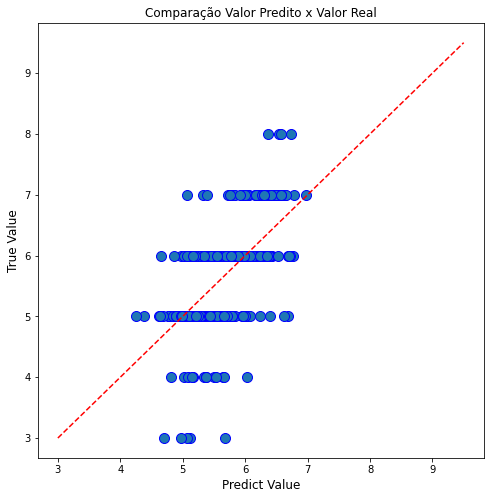

In [1307]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

O gráfico acima indica que os valores preditos não se ajustam muito bem aos dados reais. Um melhor ajuste seria representado com mais bolinhas azuis sobre a linha tracejada vermelha. 

<br>

__Métricas para analisar numericamente o quão ajustado está o modelo:__

In [1308]:
#Calcula o MSE (mean squared error) - erro médio quadrático
# Usado como comparativo de modelos
# Avalia o quão longe estão as previsões dos valores reais, "penalizando" valores muito distantes do alvo
MSE_linear_completo_red = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
# Usado como comparativo de modelos
RMSE_linear_completo_red = np.sqrt(MSE_linear_completo_red)

#Calcula o MAE (mean absolute error)
# Usado como comparativo de modelos
# Avalia o quão longe estão as previsões dos valores reais, mas, ao contrário do MSE, não "penaliza" valores muito distantes
# neste caso é mais importante o erro como um todo.
MAE_linear_completo_red = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
# Varia de 0 a 1 e sinaliza o quão ajustados está o modelo, ou seja, quanto mais perto de 1, mais o modelo representa os 
# dados reais
R2_linear_completo_red = r2_score(y_test, y_pred)


# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_completo_red, 3))
print('MSE: ', np.round(MSE_linear_completo_red, 3))
print('MAE: ', np.round(MAE_linear_completo_red, 3))
print('R2:  ', np.round(R2_linear_completo_red, 3))

Métricas: 
RMSE:  0.647
MSE:  0.419
MAE:  0.494
R2:   0.382


Utilizando o R2 como métrica, o modelo se ajusta em 38% aos dados.

<br>

__Feature importance__: avaliando quais variáveis têm maior impacto no modelo - etapas retiradas da aula 2 (professor Sandro)

In [1309]:
# Coeficientes betas para a regrressão
coefs = model.coef_
coefs

array([-0.05422111, -0.176024  ,  0.00386202, -0.02391399, -0.09725203,
        0.06826247, -0.12484942,  0.03842729, -0.12312193,  0.15236532,
        0.32780469])

In [1310]:
# cria algumas listas auxiliares
list_columns = X_train.columns
list_features = []
list_score = []

# loop para vincular o nome da feature com o respectivo coeficiente
for i, v in enumerate(coefs):
    list_features.append(list_columns[i])
    list_score.append(v)

In [1311]:
# Cria um dicionario das Features
dictionary = {'Features': list_features,
               'Scores': list_score}

In [1312]:
# Criação do DataFrame
df = pd.DataFrame(dictionary)

#ordena os coeficientes
df = df.sort_values(['Scores'], ascending = False)
df

,Features,Scores
10,alcohol,0.327805
9,sulphates,0.152365
5,free sulfur dioxide,0.068262
7,density,0.038427
2,citric acid,0.003862
3,residual sugar,-0.023914
0,fixed acidity,-0.054221
4,chlorides,-0.097252
8,pH,-0.123122
6,total sulfur dioxide,-0.124849


<br>

### Regularização de modelo através do método Lasso

In [1355]:
lasso = Lasso(max_iter = 10000, alpha = 0.1)

In [1356]:
lasso.fit(X_train_std, y_train)

Lasso(alpha=0.1, max_iter=10000)

In [1357]:
y_pred_lasso = lasso.predict(X_test_std)

In [1358]:
coefs3 = lasso.coef_

In [1359]:
list_columns = X_train.columns
list_feature = []
list_score = []

In [1360]:
for i, v in enumerate(coefs3):
    list_feature.append(list_columns[i])
    list_score.append(v)

In [1361]:
dictionary = {'Features': list_feature,
              'Scores': list_score}

In [1362]:
df_features3 = pd.DataFrame(dictionary)
df_features3 = df_features3.sort_values(by=['Scores'], ascending=False)
df_features3.reset_index(inplace=True, drop=True)
df_features3

,Features,Scores
0,alcohol,0.245849
1,sulphates,0.052404
2,fixed acidity,0.000000
3,citric acid,0.000000
4,residual sugar,-0.000000
5,chlorides,-0.000000
6,free sulfur dioxide,-0.000000
7,total sulfur dioxide,-0.000000
8,density,-0.000000
9,pH,-0.000000


<br>

### Regularização de modelo através do método Ridge

In [1345]:
# Instancia o modelo
ridge = Ridge()

In [1326]:
# Fit dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
ridge.fit(X_train_std, y_train)

Ridge()

In [1327]:
# Para os dados novos, vamos definir a predição para a base de teste
y_pred_ridge = ridge.predict(X_test_std)

In [1328]:
# Feature Importance - Ridge
coefs2 = ridge.coef_

list_columns = X_train.columns
list_feature = []
list_score = []

for i, v in enumerate(coefs2):
    list_feature.append(list_columns[i])
    list_score.append(v)

dictionary = {'Features': list_feature,
              'Scores': list_score}

df_features2 = pd.DataFrame(dictionary)
df_features2 = df_features2.sort_values(by=['Scores'], ascending=False)
df_features2.reset_index(inplace=True, drop=True)
df_features2

,Features,Scores
0,alcohol,0.326290
1,sulphates,0.152447
2,free sulfur dioxide,0.067930
3,density,0.036305
4,citric acid,0.003985
5,residual sugar,-0.023338
6,fixed acidity,-0.051934
7,chlorides,-0.096997
8,pH,-0.121677
9,total sulfur dioxide,-0.124480


<br>

__Conclusão:__ os testes de regularização confirmaram nossa hipóteses sobre as variáveis mais relevantes. Apesar disso a regularização não teve tanto impacto porque os valores são muito próximos, não demonstrando diferença significativa.
Dessa forma as regularizações serão mantidas para observação apenas no dataset do vinho tinto.

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/226/226972.png?w=740" width="20">
    <font size="+2">Conclusão do modelo de regressão linear - Vinho tinto</font>
</div>

Durante a análise exploratória verificamos que as variáveis (features) não tinham uma forte tendência linear quando analisadas individualmente em relação a qualidade (vide prévia no pairplot e mapa de calor de correlação), ou seja, a regressão linear provavelmente não seria o melhor modelo para representar a influência dessas variáveis na qualidade do vinho.<br><br>

Os resultados do feature importance confirmaram a análise exploratória dos dados que indicou o álcool como maior influência para a qualidade. A variável sulfato também foi avaliada na análise prévia, mas o ácido cítrico não impactou da forma como avaliado anteriormente. A acidez volátil tem o maior impacto negativo avaliado na EDA e na ordenação das features. As diferenças observadas provavelmente acontecem pois na EDA fazemos avaliações binárias ou de poucas variáveis diretamente com a qualidade. No modelo são apresentados os graus de relação entre todas as variáveis quando estamos querendo descobrir a qualidade do vinho.<br><br>

O gráfico de y predito e y real mostra que a maioria dos dados não fica distribuido sobre ou em torno da reta proposta pelo modelo, não possuindo uma característica do x crescer proporcionalmente (ou inversamente proporcional) ao y.<br>
O resultado de R2 confirma que a relação entre as features e a qualidade pode não ser linear. O R2 indica que apenas 38% dos dados ficam bem ajustados a reta proposta pelo modelo, ou seja, a maior parte dos dados não esta reprensentada e, por isso, provavelmente teríamos uma baixa taxa de acerto quando utilizássemos este modelo para prever a qualidade de novos vinhos dados os parâmetros presentes no dataset.<br><br>

O modelo linear, portanto, não é o mais adequado para este conjunto de dados e temos um cenário de __underfitting__.

<br>

### Avaliação do modelo retirando os outliers

Outliers são dados que ficam muito distantes dos demais e podem exercer grande influência no modelo de regressão linear. Para avaliar se os outliers presentes em cada variável estava influenciando o modelo, realizamos os passos abaixo para um novo teste.

In [1126]:
#Separação da base da variável resposta
X = wine_red_drop_outlier.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_red_drop_outlier['quality']

In [1127]:
#Separação das bases em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [1128]:
# Instanciar a normalização
scaler = StandardScaler()

In [1129]:
# Aplicação da Normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [1130]:
# Instancie a classe do estimador
model = LinearRegression()

In [1131]:
# Fit dos dados
model.fit(X_train_std, y_train)

LinearRegression()

In [1132]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

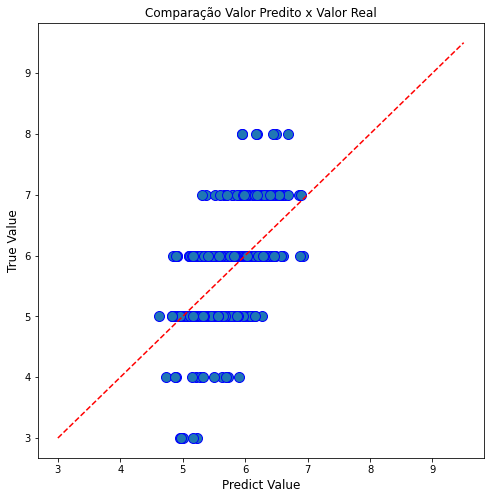

In [1133]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [1134]:
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_drop_outliers_red = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_drop_outliers_red = np.sqrt(MSE_linear_drop_outliers_red)

#Calcula o MAE (mean absolute error)
MAE_linear_drop_outliers_red = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_drop_outliers_red = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_drop_outliers_red, 3))
print('MSE: ', np.round(MSE_linear_drop_outliers_red, 3))
print('MAE: ', np.round(MAE_linear_drop_outliers_red, 3))
print('R2:  ', np.round(R2_linear_drop_outliers_red, 3))

Métricas: 
RMSE:  0.673
MSE:  0.453
MAE:  0.513
R2:   0.398


<br>

__Conculsão da regressão linear com a remoção de outliers selecionados:__ <br>
A retirada dos outliers selecionados melhorou o modelo em pouco mais de 1,5%.<br><br>
Como o volume de dados presentes no dataset não é grande, optamos por remover apenas aqueles que tivessem mais de um outlier. Dessa forma ainda existem dados que podem estar impactando o resultado da regressão linear, embora tenhamos visto a baixa correlação linear entre as variáveis.
Portanto a retirada de registros pode prejudicar as análises e a utilização do dataset completo possivelmente trará melhores resultados.

<br>

### Modelagem - regressão linear - por variável para estudar a influência sobre a qualidade

Utilização dos passos realizados anteriormente para o conjunto de variáveis.

<br>

#### Modelagem com Volatile Acidity apenas - Regressão Linear

In [368]:
#Montagem do dataset apenas com a variável volatile acidity e qualidade
wine_red_trat_vol_aci = wine_red_trat[['volatile acidity', 'quality']].copy()

In [369]:
#Separação da base da variável target
X = wine_red_trat_vol_aci.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_red_trat_vol_aci['quality']

In [370]:
#Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [371]:
# Instanciar a normalização
scaler = StandardScaler()

In [372]:
#Aplicação da normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [373]:
#Fit dos dados
model.fit(X_train_std, y_train)

LinearRegression()

In [374]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

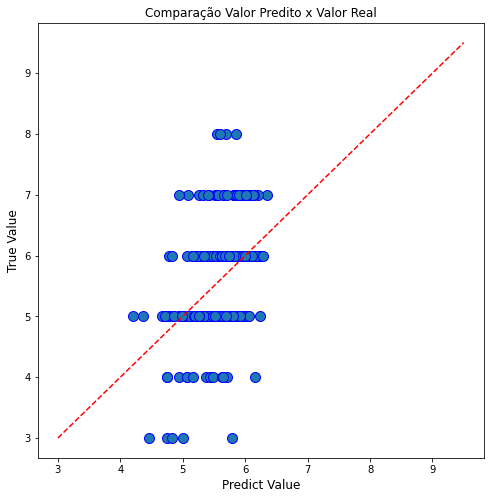

In [375]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [376]:
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_volatile_acidity = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_volatile_acidity = np.sqrt(MSE_linear_volatile_acidity)

#Calcula o MAE (mean absolute error)
MAE_linear_volatile_acidity = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_volatile_acidity = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_volatile_acidity, 3))
print('MSE: ', np.round(MSE_linear_volatile_acidity, 3))
print('MAE: ', np.round(MAE_linear_volatile_acidity, 3))
print('R2:  ', np.round(R2_linear_volatile_acidity, 3))

Métricas: 
RMSE:  0.745
MSE:  0.555
MAE:  0.584
R2:   0.18


<br>

#### Modelagem com Citric Acid apenas - Regressão Linear

In [381]:
#Montagem do dataset apenas com a variável citric acid e qualidade
wine_red_trat_cit_aci = wine_red_trat[['citric acid', 'quality']].copy()

In [382]:
#Separação da base da variável target
X = wine_red_trat_cit_aci.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_red_trat_cit_aci['quality']

In [383]:
#Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [384]:
#Aplicação da normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [385]:
#Fit dos dados
model.fit(X_train_std, y_train)

LinearRegression()

In [386]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

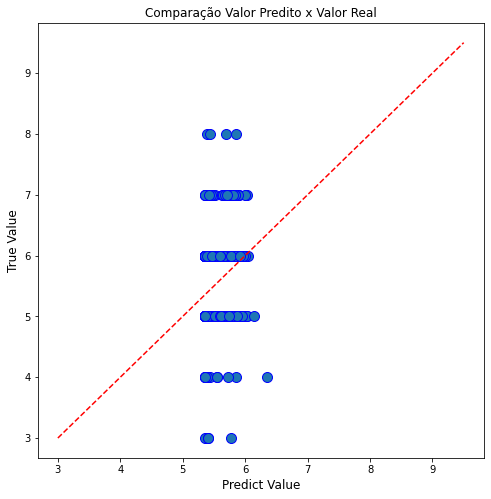

In [387]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [388]:
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_citric_acid = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_citric_acid = np.sqrt(MSE_linear_citric_acid)

#Calcula o MAE (mean absolute error)
MAE_linear_citric_acid = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_citric_acid = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_citric_acid, 3))
print('MSE: ', np.round(MSE_linear_citric_acid, 3))
print('MAE: ', np.round(MAE_linear_citric_acid, 3))
print('R2:  ', np.round(R2_linear_citric_acid, 3))

Métricas: 
RMSE:  0.806
MSE:  0.649
MAE:  0.659
R2:   0.041


<br>

#### Modelagem com Sulphates apenas - Regressão Linear

In [389]:
#Montagem do dataset apenas com a variável sulphates e qualidade
wine_red_trat_sul = wine_red_trat[['sulphates', 'quality']].copy()

In [390]:
#Separação da base da variável target
X = wine_red_trat_sul.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_red_trat_sul['quality']

In [391]:
#Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [392]:
#Aplicação da normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [393]:
#Fit dos dados
model.fit(X_train_std, y_train)

LinearRegression()

In [394]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

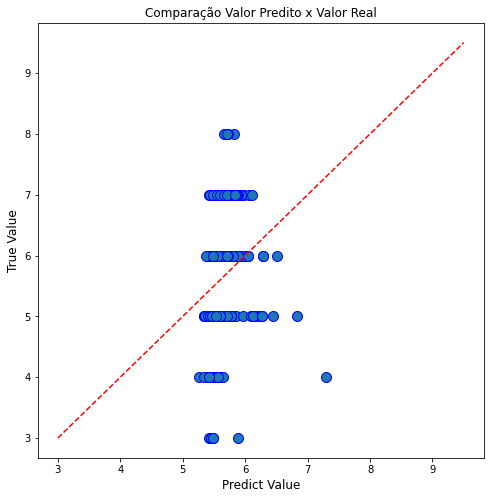

In [395]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [396]:
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_sulphates = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_sulphates = np.sqrt(MSE_linear_sulphates)

#Calcula o MAE (mean absolute error)
MAE_linear_sulphates = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_sulphates = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_sulphates, 3))
print('MSE: ', np.round(MSE_linear_sulphates, 3))
print('MAE: ', np.round(MAE_linear_sulphates, 3))
print('R2:  ', np.round(R2_linear_sulphates, 3))

Métricas: 
RMSE:  0.801
MSE:  0.642
MAE:  0.647
R2:   0.051


<br>

#### Modelagem com pH apenas - Regressão Linear

In [397]:
#Montagem do dataset apenas com a variável pH e qualidade
wine_red_trat_ph = wine_red_trat[['pH', 'quality']].copy()

In [398]:
#Separação da base da variável target
X = wine_red_trat_ph.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_red_trat_ph['quality']

In [399]:
#Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [400]:
#Aplicação da normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [401]:
#Fit dos dados
model.fit(X_train_std, y_train)

LinearRegression()

In [402]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

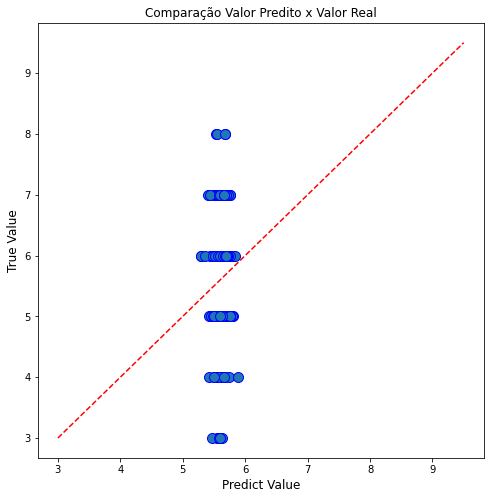

In [403]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [404]:
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_pH = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_pH = np.sqrt(MSE_linear_pH)

#Calcula o MAE (mean absolute error)
MAE_linear_pH = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_pH = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_pH, 3))
print('MSE: ', np.round(MSE_linear_pH, 3))
print('MAE: ', np.round(MAE_linear_pH, 3))
print('R2:  ', np.round(R2_linear_pH, 3))

Métricas: 
RMSE:  0.827
MSE:  0.684
MAE:  0.695
R2:   -0.01


<br>

#### Modelagem com Alcohol apenas - Regressão Linear

In [405]:
#Montagem do dataset apenas com a variável alcohol e qualidade
wine_red_trat_alc = wine_red_trat[['alcohol', 'quality']].copy()

In [406]:
#Separação da base da variável target
X = wine_red_trat_alc.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_red_trat_alc['quality']

In [407]:
#Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [408]:
#Aplicação da normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [409]:
#Fit dos dados
model.fit(X_train_std, y_train)

LinearRegression()

In [410]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

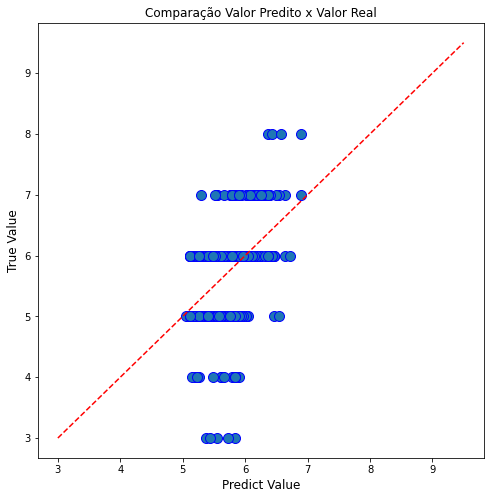

In [411]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [412]:
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_alcohol = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_alcohol = np.sqrt(MSE_linear_alcohol)

#Calcula o MAE (mean absolute error)
MAE_linear_alcohol = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_alcohol = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_alcohol, 3))
print('MSE: ', np.round(MSE_linear_alcohol, 3))
print('MAE: ', np.round(MAE_linear_alcohol, 3))
print('R2:  ', np.round(R2_linear_alcohol, 3))

Métricas: 
RMSE:  0.705
MSE:  0.498
MAE:  0.557
R2:   0.265


<br>

#### Modelagem com variáveis importantes - Regressão Linear

In [413]:
#Montagem do dataset apenas com as variáveis que parecem mais influenciar a qualidade
wine_red_trat_six = wine_red_trat[['volatile acidity', 'citric acid','sulphates', 'pH','alcohol', 'quality']].copy()

In [414]:
#Checagem do dataset montado
wine_red_trat_six

,volatile acidity,citric acid,sulphates,pH,alcohol,quality
0,0.700,0.00,0.56,3.51,9.4,5
1,0.880,0.00,0.68,3.20,9.8,5
2,0.760,0.04,0.65,3.26,9.8,5
3,0.280,0.56,0.58,3.16,9.8,6
5,0.660,0.00,0.56,3.51,9.4,5
...,...,...,...,...,...,...
1593,0.620,0.08,0.82,3.42,9.5,6
1594,0.600,0.08,0.58,3.45,10.5,5
1595,0.550,0.10,0.76,3.52,11.2,6
1597,0.645,0.12,0.71,3.57,10.2,5


In [415]:
#Separação da base da variável target
X = wine_red_trat_six.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_red_trat_six['quality']

In [416]:
#Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [417]:
# Instanciar a normalização
scaler = StandardScaler()

In [418]:
#Aplicação da normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [419]:
# Instancia o modelo
model = LinearRegression()

In [420]:
#Fit dos dados
model.fit(X_train_std, y_train)

LinearRegression()

In [421]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

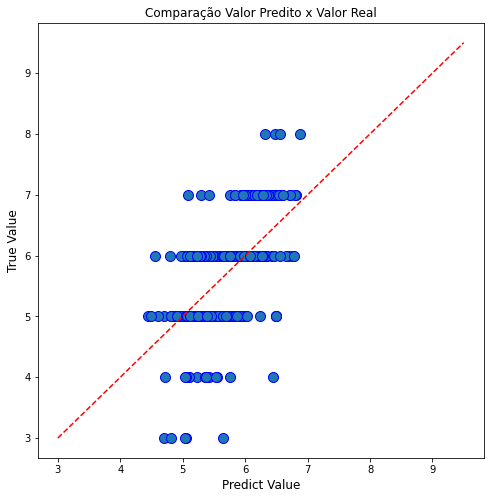

In [422]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [423]:
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_six = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_six = np.sqrt(MSE_linear_six)

#Calcula o MAE (mean absolute error)
MAE_linear_six = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_six = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_six, 3))
print('MSE: ', np.round(MSE_linear_six, 3))
print('MAE: ', np.round(MAE_linear_six, 3))
print('R2:  ', np.round(R2_linear_six, 3))

Métricas: 
RMSE:  0.647
MSE:  0.418
MAE:  0.5
R2:   0.382


<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/226/226972.png?w=740" width="15">
    <font size="+1.5">Conclusão do modelo de regressão linear com avaliação por variável - vinho tinto</font>
</div>

Comparação das métricas:

In [1149]:
df_metricas_vinho_tinto = pd.DataFrame()
df_metricas_vinho_tinto['Análise'] = ['Vinho tinto Completo', 
                                      'Remoção Outliers',
                                      'volatile_acidity',
                                      'citric_acid',
                                      'sulphates',
                                      'pH',
                                      'alcohol',
                                      'Variáveis mais correlacionadas'
                                     ]
df_metricas_vinho_tinto['RMSE'] = [RMSE_linear_completo_red, 
                                   RMSE_linear_drop_outliers_red,
                                   RMSE_linear_volatile_acidity,
                                   RMSE_linear_citric_acid,
                                   RMSE_linear_sulphates,
                                   RMSE_linear_pH,
                                   RMSE_linear_alcohol,
                                   RMSE_linear_six
                                  ]
df_metricas_vinho_tinto['MSE'] = [MSE_linear_completo_red, 
                                  MSE_linear_drop_outliers_red,
                                  MSE_linear_volatile_acidity,
                                  MSE_linear_citric_acid,
                                  MSE_linear_sulphates,
                                  MSE_linear_pH,
                                  MSE_linear_alcohol,
                                  MSE_linear_six
                                 ]
df_metricas_vinho_tinto['MAE'] = [MAE_linear_completo_red, 
                                  MAE_linear_drop_outliers_red,
                                  MAE_linear_volatile_acidity,
                                  MAE_linear_citric_acid,
                                  MAE_linear_sulphates,
                                  MAE_linear_pH,
                                  MAE_linear_alcohol,
                                  MAE_linear_six
                                 ]
df_metricas_vinho_tinto['R2'] = [R2_linear_completo_red, 
                                 R2_linear_drop_outliers_red,
                                 R2_linear_volatile_acidity,
                                 R2_linear_citric_acid,
                                 R2_linear_sulphates,
                                 R2_linear_pH,
                                 R2_linear_alcohol,
                                 R2_linear_six
                                ]
df_metricas_vinho_tinto

,Análise,RMSE,MSE,MAE,R2
0,Vinho tinto Completo,0.646952,0.418547,0.494350,0.381537
1,Remoção Outliers,0.673130,0.453104,0.512945,0.398249
2,volatile_acidity,0.646952,0.574254,0.585665,0.272328
3,citric_acid,0.805543,0.648899,0.659093,0.041159
4,sulphates,0.801310,0.642098,0.647480,0.051208
5,pH,0.826790,0.683582,0.695161,-0.010090
6,alcohol,0.705400,0.497589,0.557210,0.264740
7,Variáveis mais correlacionadas,0.646850,0.418415,0.499510,0.381731


<br>

Podemos notar que o modelo que teve maior r score foi o com todas as variáveis com maior correlação, indicando que as demais variáveis exercem pouca influência para a qualidade. <br>
O álcool também apresenta o maior r score entre as demais variáveis isoladas testadas, indicando que ele exerce grande influência.
Dessa forma, conforme já visto anteriormente, utilizar todas as variáveis deste dataset é a melhor opção para as análises.

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1255/1255990.png?w=740&t=st=1651687663~exp=1651688263~hmac=49e6725289d3e2aa6cb72e8ddad32f53197719c9bd8594cd72708fbe608696ae" width="20">
    <font size="+2.5">Modelagem dos Dados - Regressão Logística</font>
</div>

In [1150]:
# Separação da base e da variável resposta
X = wine_red_trat.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_red_trat['group_quality']

In [1151]:
wine_red_trat['group_quality'].value_counts(normalize = True)

Bom     0.529065
Ruim    0.470935
Name: group_quality, dtype: float64

Base balanceada, não é preciso fazer a estratificação.

In [1152]:
# Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [1153]:
# Instanciar a normalização
scaler = StandardScaler()

In [1154]:
# Aplicação da Normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [1155]:
#Instanciando o modelo
model = LogisticRegression()

In [1156]:
#Treinando o modelo
model.fit(X_train_std,y_train)

LogisticRegression()

In [1157]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

In [1158]:
# Calculo das probabilidades de cada uma das classes
y_proba = model.predict_proba(X_test_std)

<br>

Avaliação do modelo utilizando a **matriz de confusão**.

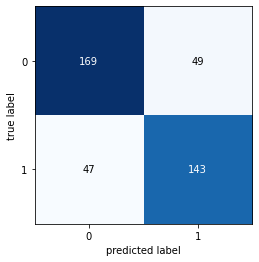

In [1159]:
#Criação da matriz de confusão
cm_completo_red = confusion_matrix(y_test, y_pred)
cm_completo_red

# Plote da Matriz de Confusão
plot_confusion_matrix(cm_completo_red)
plt.show()

In [1160]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         Bom       0.78      0.78      0.78       218
        Ruim       0.74      0.75      0.75       190

    accuracy                           0.76       408
   macro avg       0.76      0.76      0.76       408
weighted avg       0.76      0.76      0.76       408



In [1161]:
print(accuracy_score(y_test, y_pred))

0.7647058823529411


C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaco

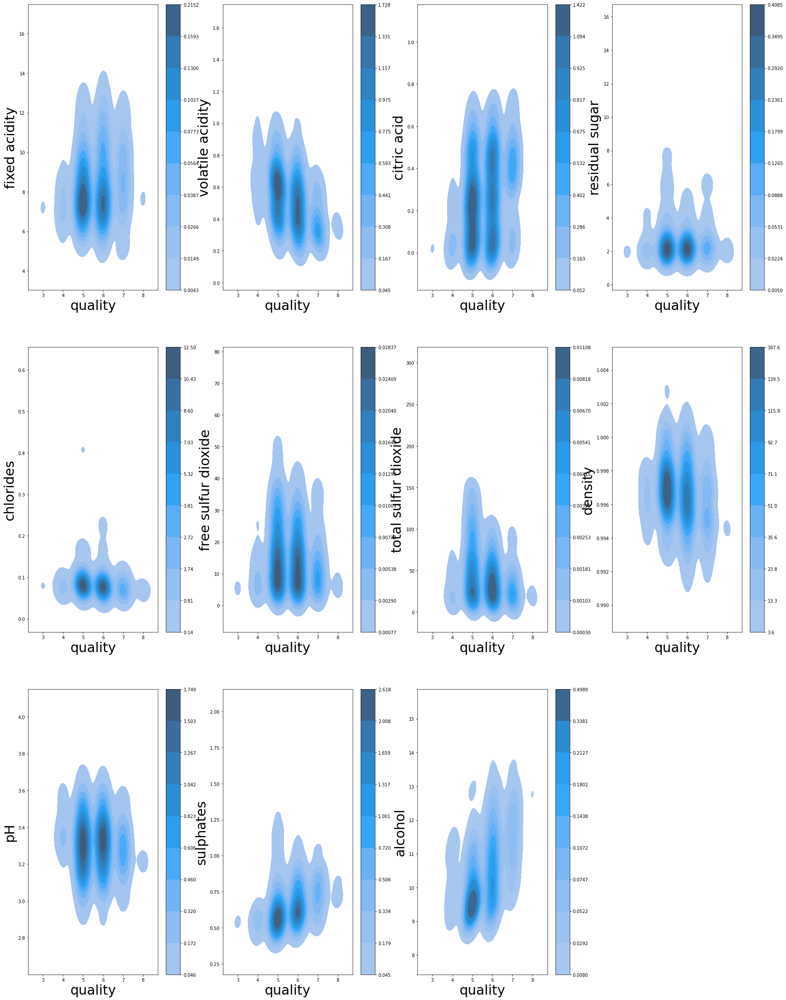

In [1162]:
fig = plt.figure(figsize = (30,40)) 
ax1 = fig.add_subplot(3, 4, 1) 
ax2 = fig.add_subplot(3, 4, 2)
ax3 = fig.add_subplot(3, 4, 3)
ax4 = fig.add_subplot(3, 4, 4)
ax5 = fig.add_subplot(3, 4, 5)
ax6 = fig.add_subplot(3, 4, 6)
ax7 = fig.add_subplot(3, 4, 7)
ax8 = fig.add_subplot(3, 4, 8)
ax9 = fig.add_subplot(3, 4, 9)
ax10 = fig.add_subplot(3, 4, 10)
ax11 = fig.add_subplot(3, 4, 11)

sns.kdeplot(x='quality', y=wine_red_trat['fixed acidity'], data=wine_red, ax=ax1, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['volatile acidity'], data=wine_red, ax=ax2, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['citric acid'], data=wine_red, ax=ax3, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['residual sugar'], data=wine_red, ax=ax4, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['chlorides'], data=wine_red, ax=ax5, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['free sulfur dioxide'], data=wine_red, ax=ax6, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['total sulfur dioxide'], data=wine_red, ax=ax7, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['density'], data=wine_red, ax=ax8, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['pH'], data=wine_red, ax=ax9, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['sulphates'], data=wine_red, ax=ax10, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_red_trat['alcohol'], data=wine_red, ax=ax11, shade=True, shade_lowest = False, cbar=True)
ax1.xaxis.label.set_size(30)
ax1.yaxis.label.set_size(30)
ax2.xaxis.label.set_size(30)
ax2.yaxis.label.set_size(30)
ax3.xaxis.label.set_size(30)
ax3.yaxis.label.set_size(30)
ax4.xaxis.label.set_size(30)
ax4.yaxis.label.set_size(30)
ax5.xaxis.label.set_size(30)
ax5.yaxis.label.set_size(30)
ax6.xaxis.label.set_size(30)
ax6.yaxis.label.set_size(30)
ax7.xaxis.label.set_size(30)
ax7.yaxis.label.set_size(30)
ax8.xaxis.label.set_size(30)
ax8.yaxis.label.set_size(30)
ax9.xaxis.label.set_size(30)
ax9.yaxis.label.set_size(30)
ax10.xaxis.label.set_size(30)
ax10.yaxis.label.set_size(30)
ax11.xaxis.label.set_size(30)
ax11.yaxis.label.set_size(30)

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/226/226972.png?w=740" width="15">
    <font size="+1.75">Conclusão do modelo de regressão logística</font>
</div>

__Acurácia__: 76,4%, ou seja, o modelo acertou 76,4% das classificações (considerando a classificação como vinho bom ou ruim). <br>
__Precisão__: 78% - Bom, ou seja, de todas as classificações positivas, 78% estavam corretas. <br>
__Recall__: 78% - Bom, ou seja, de todos os vinhos classificados como bons, o modelo acertou 78%. <br>

Como estamos trabalhando com classicação de vinhos, os valores verdadeiros são mais importantes do que os erros, dessa forma uma acurácia de 76,4% representa um bom modelo.

O resultado encontrado pode ter relação com o volume de dados não muito grande e o número de outliers nos registros.

<br>

---

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1150/1150339.png?w=740&t=st=1651079212~exp=1651079812~hmac=a5af5cf115560a810ef79ee585949f781f8440c47ff6ac0f3014bc8304aec86a" width="30">
    <font size="+3.5">Análise do dataset de Vinhos Brancos</font>
</div>

<br>

In [1163]:
# Importe dos dados pelo CSV
wine_white = pd.read_csv('./datasets/winequality-white.csv', sep=';')

Olhando para os dados:

In [1164]:
wine_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [1165]:
# Verificando o shape dos dados
wine_white.shape

(4898, 12)

In [1166]:
#Calcular as frequências das notas
wine_white['quality'].value_counts()

6    2198
5    1457
7     880
8     175
4     163
3      20
9       5
Name: quality, dtype: int64

In [1167]:
wine_white.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


<br>

### Preparação dos Dados e Verificação de Consistência

__Verificação de dados faltantes__

In [1168]:
#Verificação da existência de dados nulos no dataset
wine_white.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [1169]:
#Verificando os dados zerados
wine_white[wine_white == 0].count()

fixed acidity            0
volatile acidity         0
citric acid             19
residual sugar           0
chlorides                0
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       0
sulphates                0
alcohol                  0
quality                  0
dtype: int64

Seguindo o mesmo racional do vinho tinto, os resultados 0 para os ácido cítrico serão mantidos.

Todas as colunas são numéricas e, por isso, podemos aplicar os modelos de regressão linear e logística.

<br>

__Análise de dados duplicados__

In [1170]:
#Contagem dos dados duplicados
wine_white.duplicated().value_counts()

False    3961
True      937
dtype: int64

In [1187]:
#Criando uma cópia do dataframe original para aplicar as correções
wine_white_trat = wine_white.copy()

#Remoção dos dados duplicados
wine_white_trat.drop_duplicates(inplace=True)

#Checagem se os dados duplicados foram removidos
wine_white_trat.duplicated().sum()

0

In [1188]:
#Checagem do tamanho do dataset após remoção dos duplicados - Redução dos dados de 1599 para 1359 (240 dados duplicados foram removidos)
wine_white_trat.shape

(3961, 12)

<br>

__Análise de outliers__

* Fixed acidity

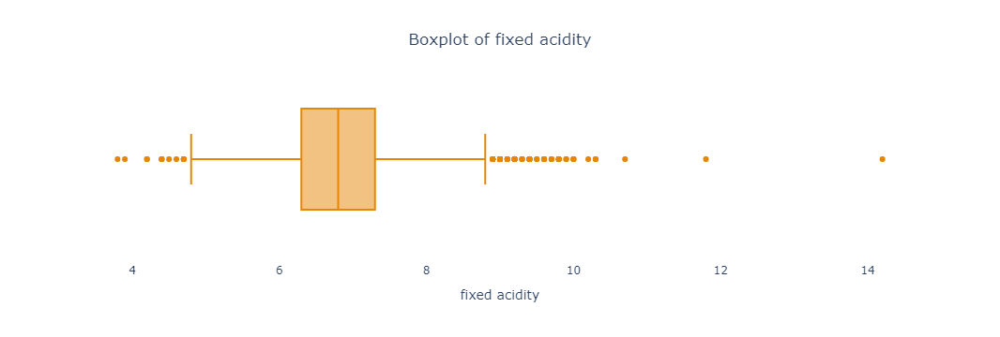

In [443]:
#Verificação de outliers para 'fixed acidity'
fig = px.box(wine_white_trat, x='fixed acidity', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of fixed acidity",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [444]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_white_trat[wine_white_trat['fixed acidity'] > 8.8].count()[0]

92

In [445]:
#Contagem da quantidade de outliers a partir da visualização gráfica menores que o limite mínimo
wine_white_trat[wine_white_trat['fixed acidity'] < 4.8].count()[0]

14

Para os ácidos fixos (aqueles que não são capazes de volatilazação), os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (92) superiores ao limite máximo com valor de 8.8 e inferiores ao limite mínimo de 4.8 (14 registros). Preferível manter todos os dados numa primeira análise.

* Volatile acidity

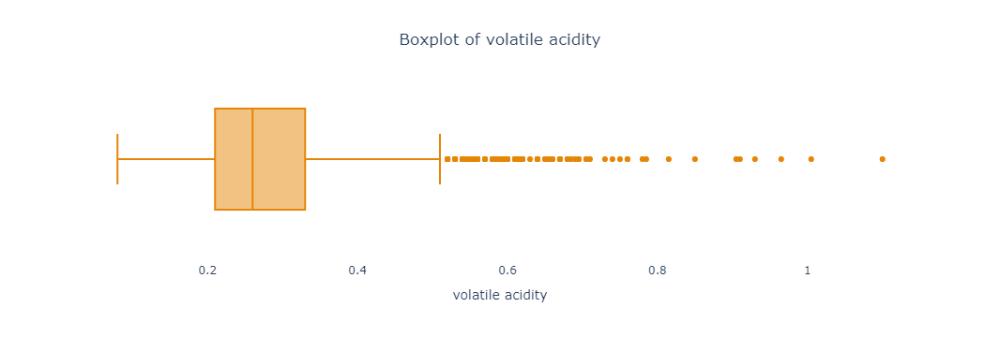

In [446]:
#Verificação de outliers para 'volatile acidity'
fig = px.box(wine_white_trat, x='volatile acidity', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of volatile acidity",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [18]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_white_trat[wine_white_trat['volatile acidity'] > 0.51].count()[1]

133

Para os ácidos voláteis, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (133) superiores ao limite máximo com valor de 0.51. Preferível manter todos os dados numa primeira análise.

* Citric acid

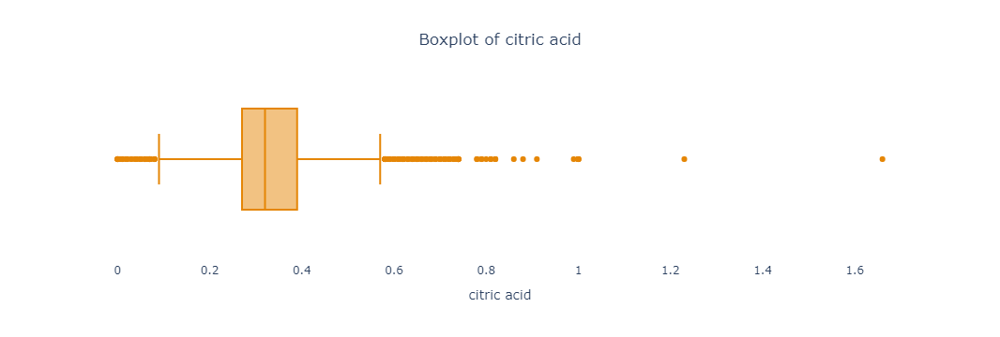

In [447]:
#Verificação de outliers para 'citric acid'
fig = px.box(wine_white_trat, x='citric acid', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of citric acid",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [448]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_white_trat[wine_white_trat['citric acid'] > 0.57].count()[1]

145

In [449]:
#Contagem da quantidade de outliers a partir da visualização gráfica abaixo do limite mínimo
wine_white_trat[wine_white_trat['citric acid'] < 0.09].count()[1]

67

Para o ácido cítrico, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (145) superiores ao limite máximo com valor de 0.57 e inferiores ao limite mínimo de 0.09 (67 registros). Preferível manter todos os dados numa primeira análise.

* Residual sugar

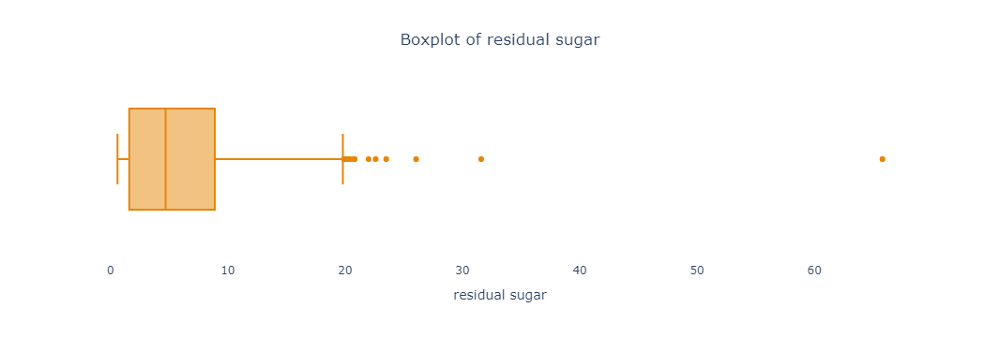

In [450]:
#Verificação de outliers para 'residual sugar'
fig = px.box(wine_white_trat, x='residual sugar', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of residual sugar",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [451]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_white_trat[wine_white_trat['residual sugar'] > 19.8].count()[1]

16

Para os açúcares residuais, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (16) superiores ao limite máximo com valor de 19.8. Preferível manter todos os dados numa primeira análise.

* Chlorides

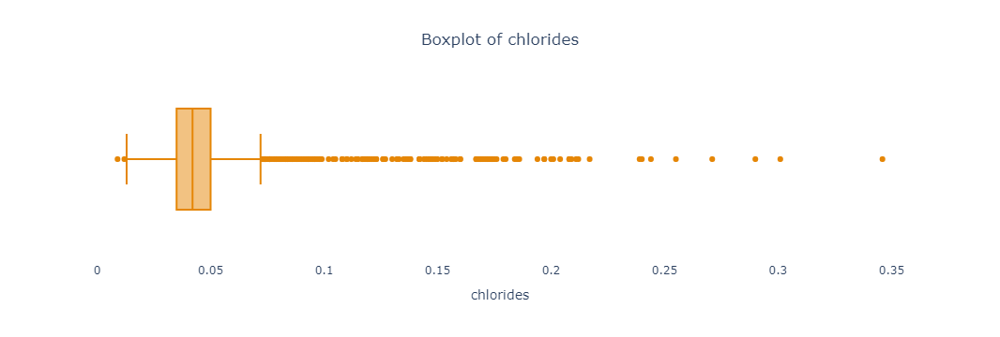

In [452]:
#Verificação de outliers para 'chlorides'
fig = px.box(wine_white_trat, x='chlorides', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of chlorides",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [453]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_white_trat[wine_white_trat['chlorides'] > 0.072].count()[1]

176

In [454]:
#Contagem da quantidade de outliers a partir da visualização gráfica abaixo do limite mínimo
wine_white_trat[wine_white_trat['chlorides'] < 0.013].count()[1]

2

Para o cloreto, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (176) superiores ao limite máximo com valor de 0.072 e inferiores ao limite mínimo de 0.013 (2 registros). Preferível manter todos os dados numa primeira análise.

* Free sulfur dioxide

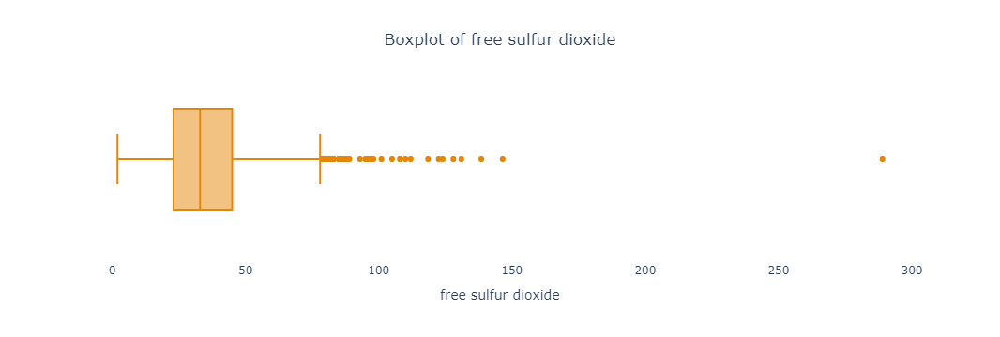

In [455]:
#Verificação de outliers para 'free sulfur dioxide'
fig = px.box(wine_white_trat, x='free sulfur dioxide', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of free sulfur dioxide",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [456]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_white_trat[wine_white_trat['free sulfur dioxide'] > 78].count()[1]

44

Para dióxido de enxofre livre, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (44) superiores ao limite máximo com valor de 78. Um dos valores está distante da concentração dos dados, mas neste momento é preferível manter todos os dados para uma primeira análise.

* Total sulfur dioxide

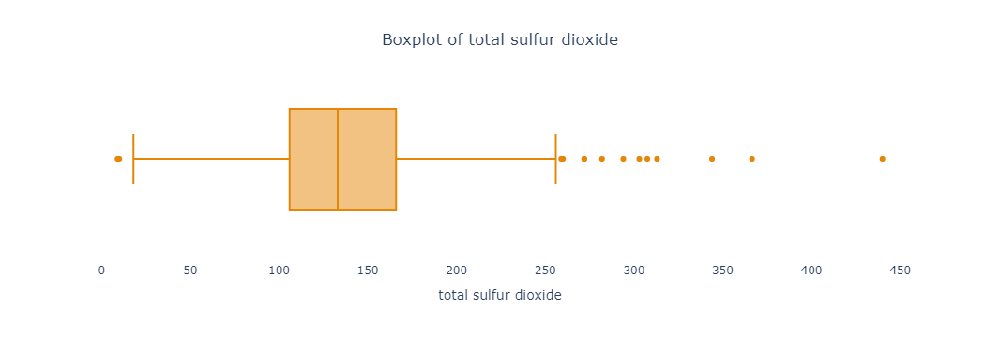

In [457]:
#Verificação de outliers para 'total sulfur dioxide'
fig = px.box(wine_white_trat, x='total sulfur dioxide', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of total sulfur dioxide",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [458]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_white_trat[wine_white_trat['total sulfur dioxide'] > 256].count()[1]

12

In [459]:
#Contagem da quantidade de outliers a partir da visualização gráfica abaixo do limite mínimo
wine_white_trat[wine_white_trat['total sulfur dioxide'] < 18].count()[1]

2

Para o dióxido de enxofre total, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (12) superiores ao limite máximo com valor de 256 e inferiores ao limite mínimo de 18 (2 registros). Preferível manter todos os dados numa primeira análise.

* Density

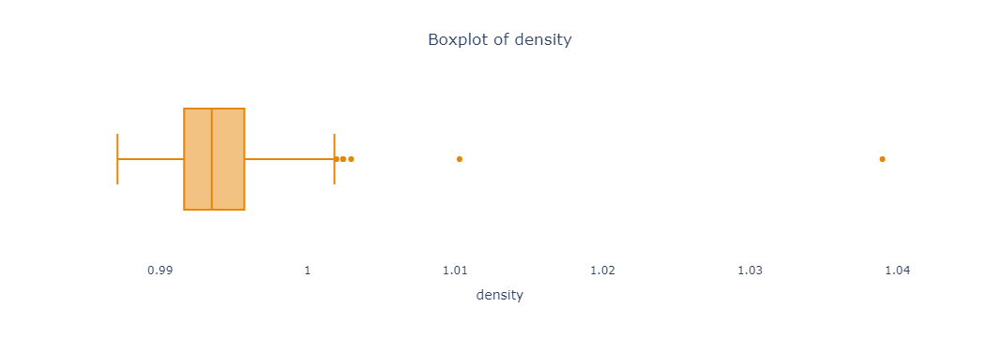

In [460]:
#Verificação de outliers para 'density'
fig = px.box(wine_white_trat, x='density', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of density",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [461]:
#Contagem dos resultados mais afastados da concentração dos dados
wine_white_trat[wine_white_trat['density'] > 1.00182].count()[1]

6

Para a densidade, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (6) superiores ao limite máximo com valor de 1.00182. Preferível manter todos os dados numa primeira análise.

* Sulphates

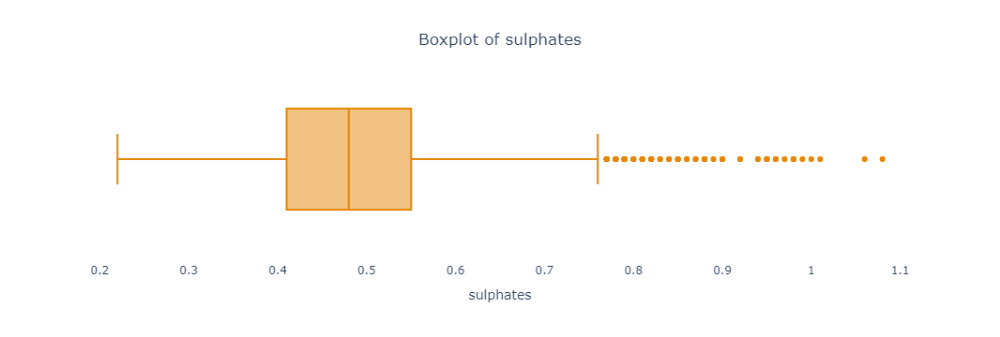

In [462]:
#Verificação de outliers para 'sulphates'
fig = px.box(wine_white_trat, x='sulphates', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of sulphates",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

In [463]:
#Contagem da quantidade de outliers a partir da visualização gráfica
wine_white_trat[wine_white_trat['sulphates'] > 0.76].count()[1]

96

Os valores de sulphates indicados como outliers não estão muito distantes dos demais valores e aparentam ser valores possíveis para o vinho, sendo 96 valores maiores do que o limite máximo de 0.76.

* Alcohol

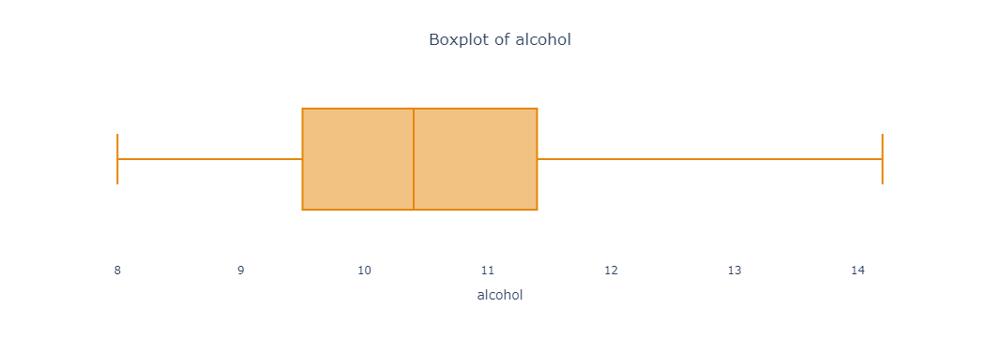

In [464]:
#Verificação de outliers para 'alcohol'
fig = px.box(wine_white_trat, x='alcohol', color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(
    title={
        'text': "Boxplot of alcohol",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    plot_bgcolor= 'rgba(0, 0, 0, 0)',
)
fig.show()

O gráfico não aponta valores como outliers.

<br>

__Resumo da etapa de limpeza e verificação:__ 
* Exclusão dos dados duplicados - 4898 registros para 3961
* Demais atributos com valores indicados como outliers serão mantidos no dataset, pois, como observado nos vinhos tinto, a remoção trouxe pouca melhora no modelo

<br>

__Salvando os dados tratados em um csv__

In [507]:
#Salvando os dados tratados 
wine_white_trat.to_csv('./datasets/winequality-white_trat.csv', sep=',',index = True)

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1215/1215931.png?w=740&t=st=1651688168~exp=1651688768~hmac=7275905f396cbefe0abef46fb49475b553b9b77001ade259c4766f033e301ffb" width="20">
    <font size="+2.5">Análise Exploratória dos Dados</font>
</div>

In [508]:
wine_white_trat.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000
mean,6.839346,0.280538,0.334332,5.914819,0.045905,34.889169,137.193512,0.993790,3.195458,0.490351,10.589358,5.854835
std,0.866860,0.103437,0.122446,4.861646,0.023103,17.210021,43.129065,0.002905,0.151546,0.113523,1.217076,0.890683
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.600000,0.035000,23.000000,106.000000,0.991620,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,4.700000,0.042000,33.000000,133.000000,0.993500,3.180000,0.480000,10.400000,6.000000
75%,7.300000,0.330000,0.390000,8.900000,0.050000,45.000000,166.000000,0.995710,3.290000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


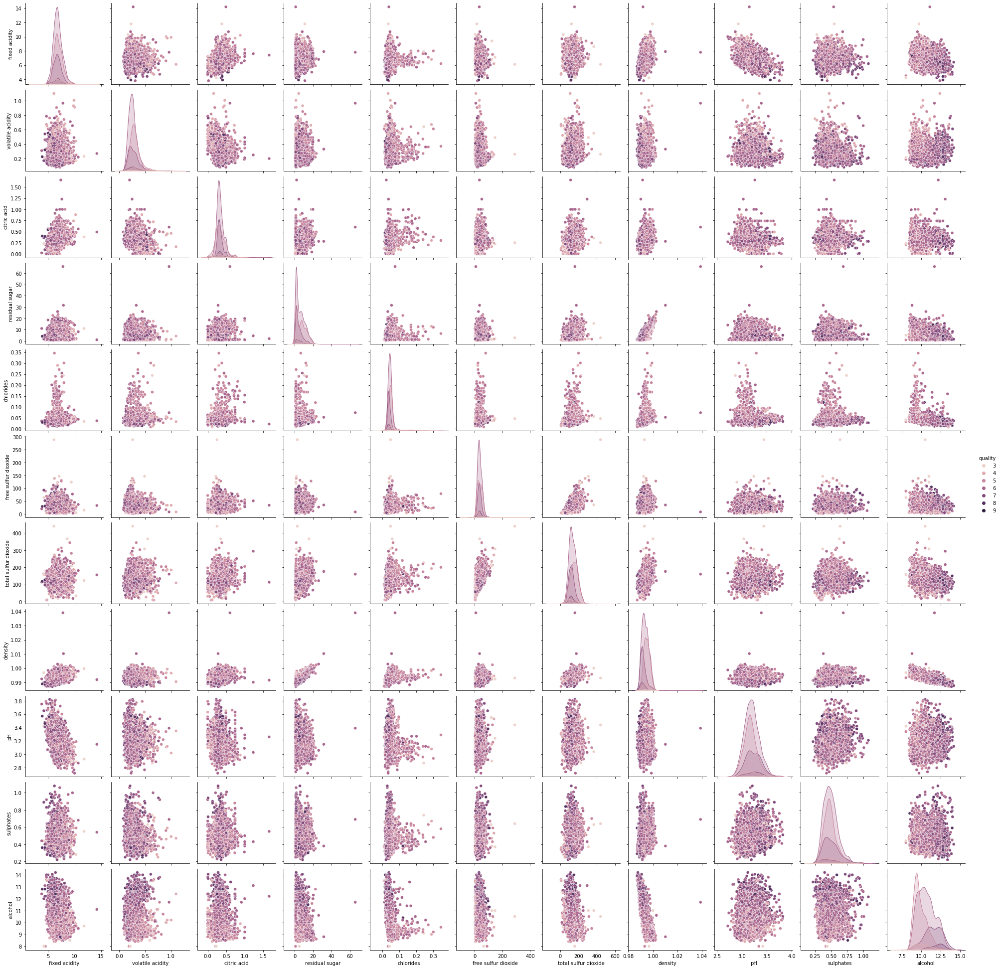

In [46]:
#Grade de gráfico com as relações entre variáveis
sns.pairplot(wine_white_trat, hue = 'quality') #overview dos dados
plt.show()

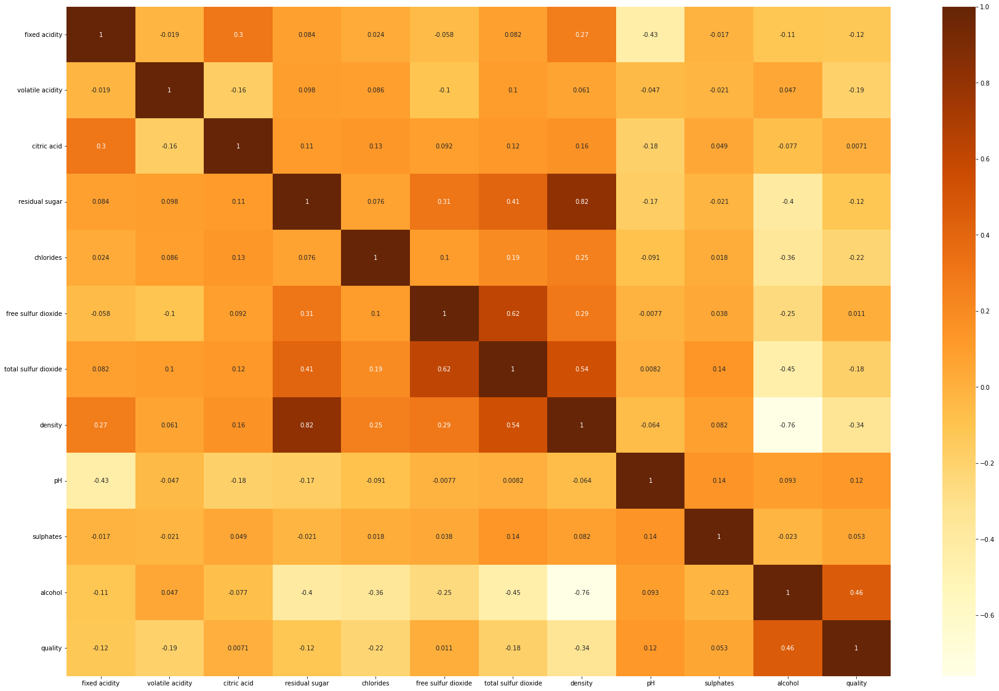

In [749]:
#Para verificar se há correlações entre as feautures e o target. Nele, 1 significa que há uma correlação positiva e -1 negativa.

plt.figure(figsize=(30,20))
cor = wine_white_trat.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.YlOrBr)
plt.show()

Em relação a qualidade, a variável com maior correlação no mapa de calor é:
- Álcool (0.462869)

Ainda em relação a qualidade, as variáveis com correlação de forma mais fraca:
- Densidade (-0.337805)    
- Cloretos (-0.217739)
Essas variáveis são diferentes do que encontrado para o vinho tinto (Sulfatos, ácido cítrico e acidez volátil)

Entre as variáveis do vinho branco, as maiores correlações são:
- Açúcar residual e densidade (0.820498)
- Dióxido de enxofre livre e total de dióxido de enxofre (0.619437)
- Total de dióxido de enxofre e densidade (0.536868)
- Densidade e álcool (-0.760162)

A correlação das variáveis também é um pouco diferente do que observado para o vinho tinto, o qual tinha bastante correlação entre acidez fixa e ácido cítrico, acidez fixa e densidade, ácido cítrico e acidez volátil, acidez fixa e pH e ácido cítrico e pH.

In [752]:
df_white_corr = wine_white_trat.corr()
df_white_corr[df_white_corr>0.2]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,NaN,0.298959,NaN,NaN,NaN,NaN,0.266091,NaN,NaN,NaN,NaN
volatile acidity,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
citric acid,0.298959,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
residual sugar,NaN,NaN,NaN,1.000000,NaN,0.306835,0.409583,0.820498,NaN,NaN,NaN,NaN
chlorides,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,0.253088,NaN,NaN,NaN,NaN
free sulfur dioxide,NaN,NaN,NaN,0.306835,NaN,1.000000,0.619437,0.294638,NaN,NaN,NaN,NaN
total sulfur dioxide,NaN,NaN,NaN,0.409583,NaN,0.619437,1.000000,0.536868,NaN,NaN,NaN,NaN
density,0.266091,NaN,NaN,0.820498,0.253088,0.294638,0.536868,1.000000,NaN,NaN,NaN,NaN
pH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
sulphates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN


In [751]:
df_white_corr = wine_white_trat.corr()
df_white_corr[df_white_corr<-0.5]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
volatile acidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
citric acid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
residual sugar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
chlorides,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
free sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
total sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
density,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.760162,NaN
pH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sulphates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:xlabel='quality', ylabel='Count'>

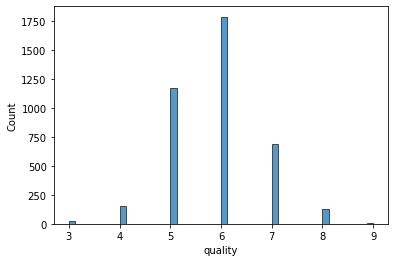

In [466]:
# histograma de quality ja possivel identificar que 5 e 6  tem um numero maior de amostras então o dataset
#esta desbalanceado isso prejudica a precisão da analise

sns.histplot(wine_white_trat['quality'])

In [62]:
wine_white_trat['quality'].value_counts(normalize = True)

6    0.451401
5    0.296642
7    0.173946
4    0.038627
8    0.033072
3    0.005049
9    0.001262
Name: quality, dtype: float64

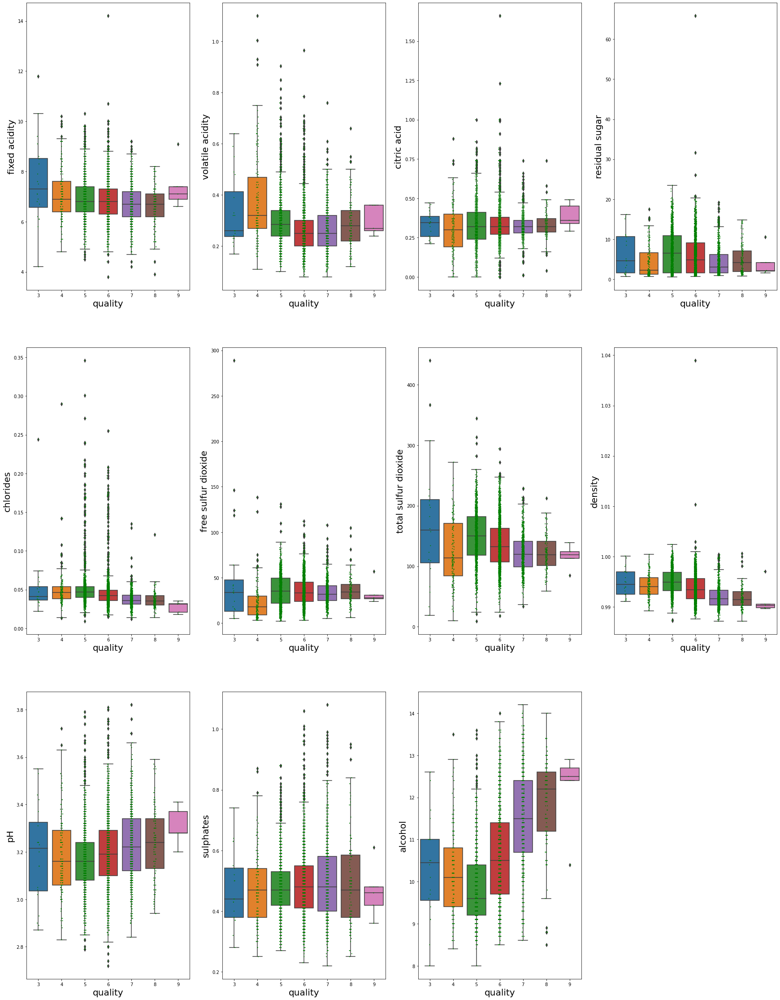

In [64]:
fig = plt.figure(figsize = (30,40)) # width x height
ax1 = fig.add_subplot(3, 4, 1) # row, column, position
ax2 = fig.add_subplot(3, 4, 2)
ax3 = fig.add_subplot(3, 4, 3)
ax4 = fig.add_subplot(3, 4, 4)
ax5 = fig.add_subplot(3, 4, 5)
ax6 = fig.add_subplot(3, 4, 6)
ax7 = fig.add_subplot(3, 4, 7)
ax8 = fig.add_subplot(3, 4, 8)
ax9 = fig.add_subplot(3, 4, 9)
ax10 = fig.add_subplot(3, 4, 10)
ax11 = fig.add_subplot(3, 4, 11)

sns.boxplot(x='quality', y=wine_white_trat['fixed acidity'], data=wine_white_trat, ax=ax1)
sns.stripplot(x='quality', y=wine_white_trat['fixed acidity'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax1)
ax1.xaxis.label.set_size(20)
ax1.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['volatile acidity'], data=wine_white_trat, ax=ax2)
sns.stripplot(x='quality', y=wine_white_trat['volatile acidity'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax2)
ax2.xaxis.label.set_size(20)
ax2.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['citric acid'], data=wine_white_trat, ax=ax3)
sns.stripplot(x='quality', y=wine_white_trat['citric acid'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax3)
ax3.xaxis.label.set_size(20)
ax3.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['residual sugar'], data=wine_white_trat, ax=ax4)
sns.stripplot(x='quality', y=wine_white_trat['residual sugar'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax4)
ax4.xaxis.label.set_size(20)
ax4.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['chlorides'], data=wine_white_trat, ax=ax5)
sns.stripplot(x='quality', y=wine_white_trat['chlorides'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax5)
ax5.xaxis.label.set_size(20)
ax5.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['free sulfur dioxide'], data=wine_white_trat, ax=ax6)
sns.stripplot(x='quality', y=wine_white_trat['free sulfur dioxide'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax6)
ax6.xaxis.label.set_size(20)
ax6.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['total sulfur dioxide'], data=wine_white_trat, ax=ax7)
sns.stripplot(x='quality', y=wine_white_trat['total sulfur dioxide'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax7)
ax7.xaxis.label.set_size(20)
ax7.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['density'], data=wine_white_trat, ax=ax8)
sns.stripplot(x='quality', y=wine_white_trat['density'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax8)
ax8.xaxis.label.set_size(20)
ax8.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['pH'], data=wine_white_trat, ax=ax9)
sns.stripplot(x='quality', y=wine_white_trat['pH'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax9)
ax9.xaxis.label.set_size(20)
ax9.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['sulphates'], data=wine_white_trat, ax=ax10)
sns.stripplot(x='quality', y=wine_white_trat['sulphates'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax10)
ax10.xaxis.label.set_size(20)
ax10.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=wine_white_trat['alcohol'], data=wine_white_trat, ax=ax11)
sns.stripplot(x='quality', y=wine_white_trat['alcohol'], data=wine_white_trat, color="green", jitter=0.05, size=2, ax=ax11)
ax11.xaxis.label.set_size(20)
ax11.yaxis.label.set_size(20)

plt.savefig('boxplot_quality.png', format='png', dpi=100)

In [1190]:
# vinho ruim (qualidade 0-5)
# bom vinho (qualidade 6-10)

group_quality_2 = []

for k in wine_white_trat['quality']:
    if k >= 0 and k < 6:
        group_quality_2.append('Ruim')
    elif k >= 6:
        group_quality_2.append('Bom')
        
wine_white_trat['group_quality'] = group_quality_2

In [534]:
#Salvando os dados tratados em um dataset
wine_white_trat.to_csv('./datasets/winequality-white_trat_group_quality.csv', sep=',',index = True)

In [1191]:
wine_white_trat.groupby('group_quality').count()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
group_quality,,,,,,,,,,,,
Bom,2613,2613,2613,2613,2613,2613,2613,2613,2613,2613,2613,2613
Ruim,1348,1348,1348,1348,1348,1348,1348,1348,1348,1348,1348,1348


<AxesSubplot:xlabel='group_quality', ylabel='count'>

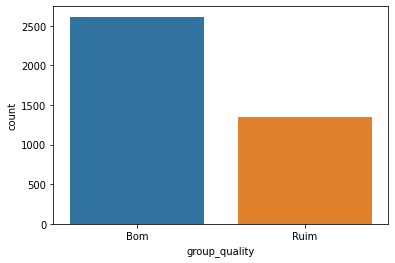

In [533]:
sns.countplot(x='group_quality', data=wine_white_trat)

In [470]:
wine_white_trat.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,group_quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,2
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,2
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,2
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,2
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6,2


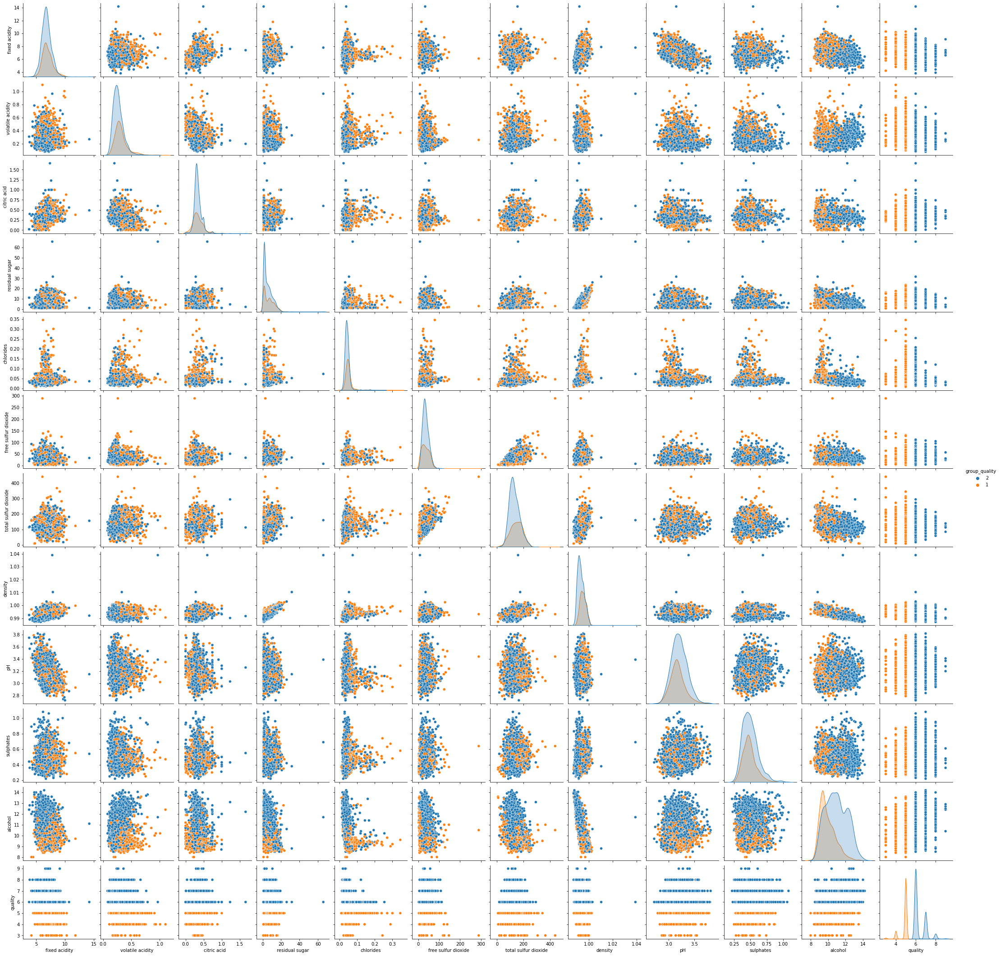

In [471]:
sns.pairplot(wine_white_trat, hue = 'group_quality')

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1255/1255990.png?w=740&t=st=1651687663~exp=1651688263~hmac=49e6725289d3e2aa6cb72e8ddad32f53197719c9bd8594cd72708fbe608696ae" width="20">
    <font size="+2.5">Modelagem dos Dados - Regressão Linear</font>
</div>

Preparação da base:
- **X :** todos as variáveis são mantidas, exceto a resposta;
- **y :** variável de resposta da wine_red_tratbase.

In [1173]:
X = wine_white_trat.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_white_trat['quality']

In [1174]:
wine_white_trat.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6


In [1175]:
X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6


Separação da base em treino e teste:

In [1176]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

Os dados possuem diferentes escalas, o que pode influenciar o modelo. Dessa forma é necessário normalizá-los. <br> 
Utilizamos o **Z-Score**.

In [1177]:
# Instanciar a normalização
scaler = StandardScaler()

In [1178]:
# Aplicação da Normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [1179]:
# Instancie a classe do estimador
model = LinearRegression()

In [1180]:
# Fit dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
model.fit(X_train_std, y_train) 

LinearRegression()

In [1181]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

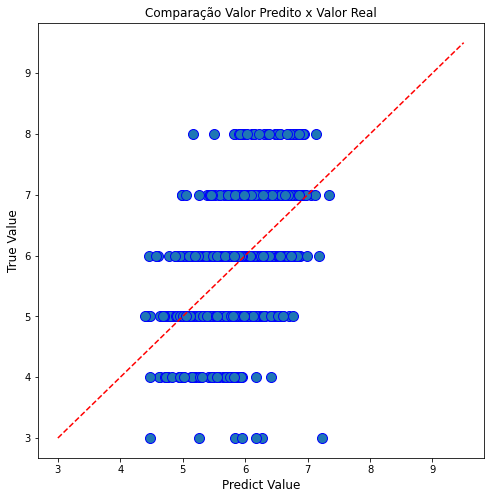

In [1182]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [1183]:
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_completo_white = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_completo_white = np.sqrt(MSE_linear_completo_white)

#Calcula o MAE (mean absolute error)
MAE_linear_completo_white = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_completo_white = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_completo_white, 3))
print('MSE: ', np.round(MSE_linear_completo_white, 3))
print('MAE: ', np.round(MAE_linear_completo_white, 3))
print('R2:  ', np.round(R2_linear_completo_white, 3))

Métricas: 
RMSE:  0.758
MSE:  0.574
MAE:  0.586
R2:   0.272


<br>

__Feature importance__: avaliando quais variáveis têm maior impacto no modelo - etapas retiradas da aula 2 (professor Sandro)

In [797]:
# Coeficientes betas para a regrressão
coefs = model.coef_
coefs

array([ 0.02969262, -0.17771101,  0.0319119 ,  0.28826621, -0.01007728,
        0.09877483, -0.03162393, -0.30941663,  0.10088143,  0.06178412,
        0.3187422 ])

In [798]:
# cria algumas listas auxiliares
list_columns = X_train.columns
list_features = []
list_score = []

# loop para vincular o nome da feature com o respectivo coeficiente
for i, v in enumerate(coefs):
    list_features.append(list_columns[i])
    list_score.append(v)

In [799]:
# Cria um dicionario das Features
dictionary = {'Features': list_features,
               'Scores': list_score}

In [800]:
# Mostra a tabela
df = pd.DataFrame(dictionary)

#ordena os coeficientes
df = df.sort_values(['Scores'], ascending = False)
df

,Features,Scores
10,alcohol,0.318742
3,residual sugar,0.288266
8,pH,0.100881
5,free sulfur dioxide,0.098775
9,sulphates,0.061784
2,citric acid,0.031912
0,fixed acidity,0.029693
4,chlorides,-0.010077
6,total sulfur dioxide,-0.031624
1,volatile acidity,-0.177711


<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/226/226972.png?w=740" width="20">
    <font size="+2">Conclusão do modelo de regressão linear - Vinhos brancos</font>
</div>

Assim como para o vinho tinto, o modelo de regressão linear não se ajuste bem ao dataset de vinhos brancos.

Os resultados do feature importance confirmaram a análise exploratória dos dados que indicou o álcool como maior influência para a qualidade. O mapa de correlação indicou também a densidade e os cloretos e na análise de feature importance as variáveis com mais influência foram o açúcar residual (positivamente) e a densidade (negativamente).<br><br>

O gráfico de y predito e y real mostra que a maioria dos dados não fica distribuido sobre ou em torno da reta proposta pelo modelo, não possuindo uma característica do x crescer proporcionalmente (ou inversamente proporcional) ao y.<br>
O resultado de R2 confirma que a relação entre as features e a qualidade pode não ser linear. O R2 indica que apenas 38% dos dados ficam bem ajustados a reta proposta pelo modelo, ou seja, a maior parte dos dados não esta reprensentada e, por isso, provavelmente teríamos uma baixa taxa de acerto quando utilizássemos este modelo para prever a qualidade de novos vinhos dados os parâmetros presentes no dataset.<br><br>

O modelo linear, portanto, não é o mais adequado para este conjunto de dados e temos um cenário de __underfitting__.

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1255/1255990.png?w=740&t=st=1651687663~exp=1651688263~hmac=49e6725289d3e2aa6cb72e8ddad32f53197719c9bd8594cd72708fbe608696ae" width="20">
    <font size="+2.5">Modelagem dos Dados - Regressão Logística</font>
</div>

In [1192]:
# Separação da base e da variável resposta
X = wine_white_trat.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = wine_white_trat['group_quality']

In [1193]:
wine_white_trat['group_quality'].value_counts(normalize = True)

Bom     0.659682
Ruim    0.340318
Name: group_quality, dtype: float64

Base desbalanceada, necessário usar a estratificação.

In [1194]:
# Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    stratify = y,
                                                    random_state = 42)

In [1195]:
# Instanciar a normalização
scaler = StandardScaler()

In [1196]:
# Aplicação da Normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [1197]:
#Instanciando
model_2 = LogisticRegression()

In [1198]:
# Fit do Modelo
model_2.fit(X_train_std, y_train)

LogisticRegression()

In [1199]:
y_pred = model_2.predict(X_test_std)

In [1200]:
# Calculo das probabilidades de cada uma das classes
y_proba = model_2.predict_proba(X_test_std)

<br>

Avaliação do modelo utilizando a **matriz de confusão**.

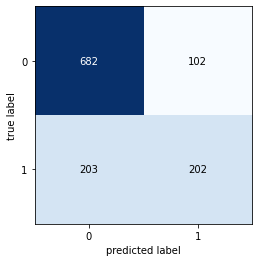

In [1201]:
cm_completo_white = confusion_matrix(y_test, y_pred)
cm_completo_white

# Plote da Matriz de Confusão
plot_confusion_matrix(cm_completo_white)
plt.show()

In [1202]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         Bom       0.77      0.87      0.82       784
        Ruim       0.66      0.50      0.57       405

    accuracy                           0.74      1189
   macro avg       0.72      0.68      0.69      1189
weighted avg       0.73      0.74      0.73      1189



In [1203]:
print(accuracy_score(y_test, y_pred))

0.7434819175777965


C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaco

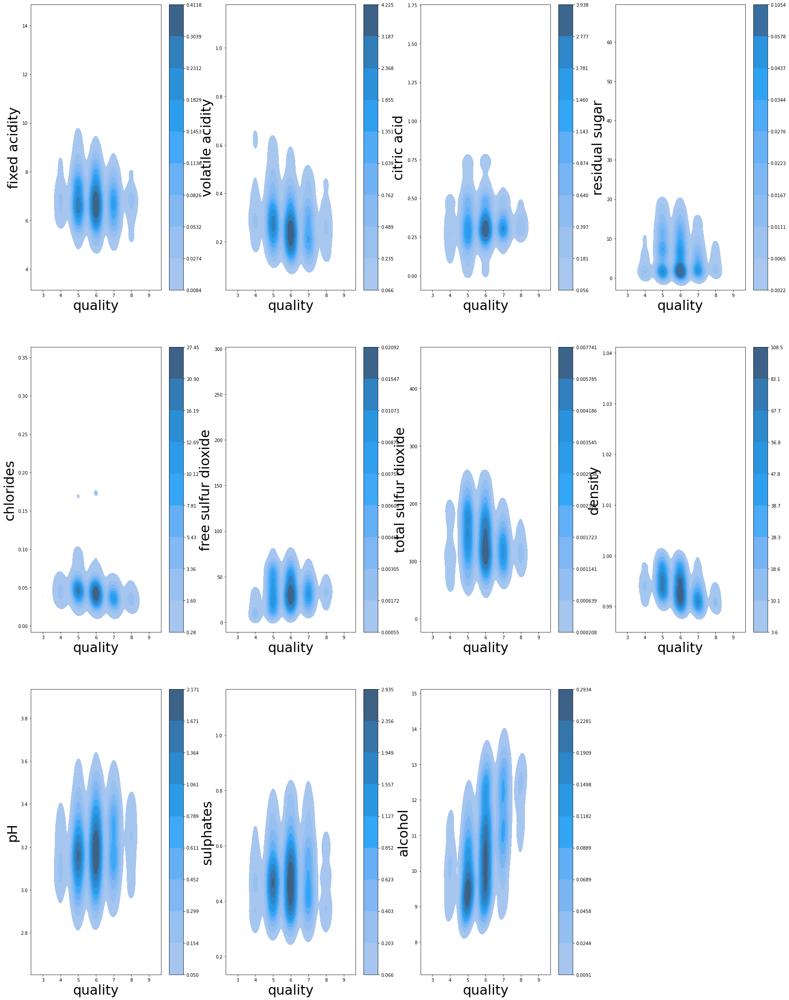

In [98]:
fig = plt.figure(figsize = (30,40)) 
ax1 = fig.add_subplot(3, 4, 1) 
ax2 = fig.add_subplot(3, 4, 2)
ax3 = fig.add_subplot(3, 4, 3)
ax4 = fig.add_subplot(3, 4, 4)
ax5 = fig.add_subplot(3, 4, 5)
ax6 = fig.add_subplot(3, 4, 6)
ax7 = fig.add_subplot(3, 4, 7)
ax8 = fig.add_subplot(3, 4, 8)
ax9 = fig.add_subplot(3, 4, 9)
ax10 = fig.add_subplot(3, 4, 10)
ax11 = fig.add_subplot(3, 4, 11)

sns.kdeplot(x='quality', y=wine_white_trat['fixed acidity'], data=wine_white_trat, ax=ax1, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['volatile acidity'], data=wine_white_trat, ax=ax2, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['citric acid'], data=wine_white_trat, ax=ax3, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['residual sugar'], data=wine_white_trat, ax=ax4, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['chlorides'], data=wine_white_trat, ax=ax5, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['free sulfur dioxide'], data=wine_white_trat, ax=ax6, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['total sulfur dioxide'], data=wine_white_trat, ax=ax7, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['density'], data=wine_white_trat, ax=ax8, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['pH'], data=wine_white_trat, ax=ax9, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['sulphates'], data=wine_white_trat, ax=ax10, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=wine_white_trat['alcohol'], data=wine_white_trat, ax=ax11, shade=True, shade_lowest = False, cbar=True)
ax1.xaxis.label.set_size(30)
ax1.yaxis.label.set_size(30)
ax2.xaxis.label.set_size(30)
ax2.yaxis.label.set_size(30)
ax3.xaxis.label.set_size(30)
ax3.yaxis.label.set_size(30)
ax4.xaxis.label.set_size(30)
ax4.yaxis.label.set_size(30)
ax5.xaxis.label.set_size(30)
ax5.yaxis.label.set_size(30)
ax6.xaxis.label.set_size(30)
ax6.yaxis.label.set_size(30)
ax7.xaxis.label.set_size(30)
ax7.yaxis.label.set_size(30)
ax8.xaxis.label.set_size(30)
ax8.yaxis.label.set_size(30)
ax9.xaxis.label.set_size(30)
ax9.yaxis.label.set_size(30)
ax10.xaxis.label.set_size(30)
ax10.yaxis.label.set_size(30)
ax11.xaxis.label.set_size(30)
ax11.yaxis.label.set_size(30)

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/226/226972.png?w=740" width="20">
    <font size="+2">Conclusão do modelo de regressão logística - Vinho branco</font>
</div>

__Acurácia__: 74,3%, ou seja, o modelo acertou 74,3% das classificações (considerando a classificação como vinho bom ou ruim). <br>
__Precisão__: 77% - Bom, ou seja, de todas as classificações positivas, 77% estavam corretas. <br>
__Recall__: 87% - Bom, ou seja, de todos os vinhos classificados como bons, o modelo acertou 87%. <br>

Como estamos trabalhando com classicação de vinhos, os valores verdadeiros são mais importantes do que os erros, dessa forma uma acurácia de 74,3% representa um bom modelo.

O resultado encontrado pode ter relação com o volume de dados não muito grande e o número de outliers nos registros.

<br>

---

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1150/1150327.png?w=740&t=st=1651079208~exp=1651079808~hmac=d3366b60f33e99e7631f856640af292ffd2d058fb817dfb61decd8bb0a4f35dd" width="30">
    <font size="+3.5">Análise dos datasets de Vinhos Tintos e Brancos em conjunto</font>
</div>

In [593]:
# Importe dos dados pelo CSV das bases já tratadas anteriormente
wine_red_for_total = pd.read_csv('./datasets/winequality-red_trat_group_quality.csv', sep=',', index_col = 0)
wine_white_for_total = pd.read_csv('./datasets/winequality-white_trat_group_quality.csv', sep=',', index_col = 0)

In [594]:
wine_red_for_total.shape

(1359, 13)

In [595]:
wine_white_for_total.shape

(3961, 13)

In [596]:
#Criando dois arrays com as palavras red e white para que possamos diferenciar os dados na união dos datasets
color_red = np.repeat('red', 1359)
color_white = np.repeat('white', 3961)

In [597]:
#Incluindo os arrays criados como colunas nos respectivos datasets
wine_red_for_total['color'] = color_red
wine_white_for_total['color'] = color_white

In [714]:
df_wine = wine_red_for_total.append(wine_white_for_total, ignore_index=True) 
df_wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,group_quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,Ruim,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,Ruim,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,Ruim,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,Bom,red
4,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,Ruim,red


In [603]:
df_wine.shape

(5320, 14)

In [604]:
df_wine.groupby('color').mean()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
color,,,,,,,,,,,,
red,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
white,6.839346,0.280538,0.334332,5.914819,0.045905,34.889169,137.193512,0.993790,3.195458,0.490351,10.589358,5.854835


<br>

__Análise de outliers__

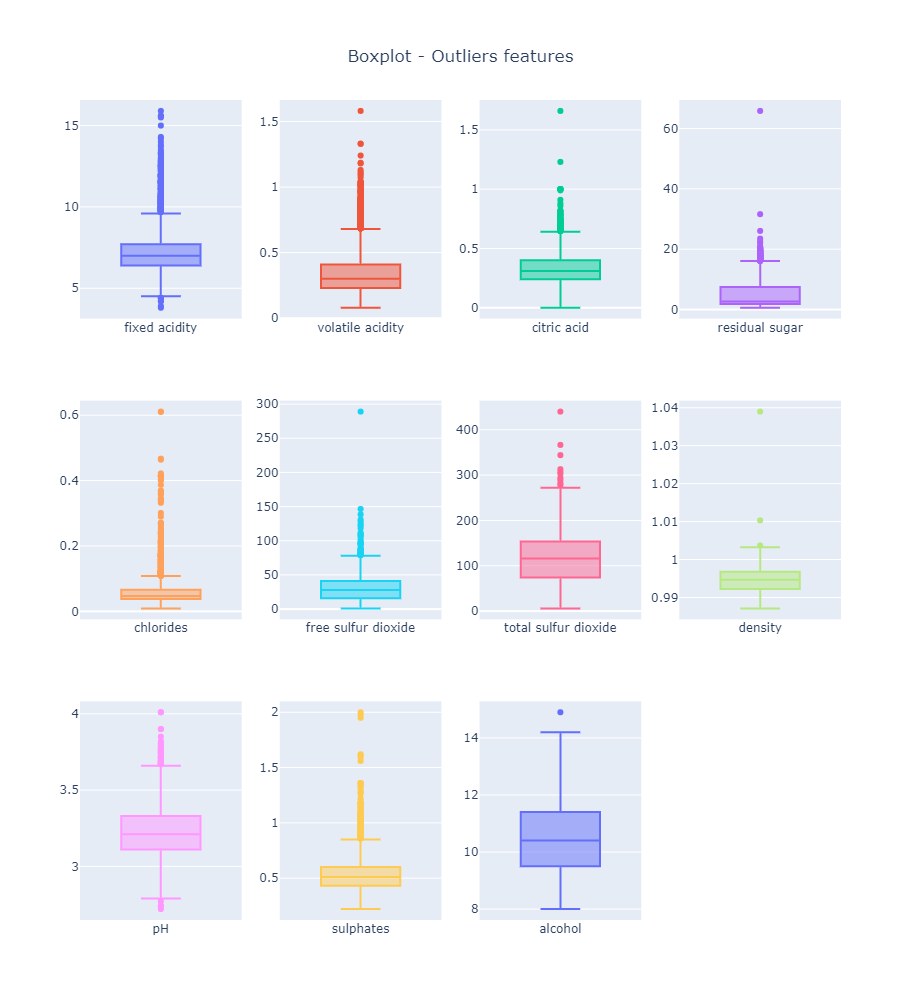

In [672]:
#Gráficos do tipo boxplot para cada variável com objetivo de visualização dos outliers

from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=4,
                   #subplot_titles=("fixed acidity", "Plot 2", "Plot 3", "Plot 4")
                   )

fig.add_trace(
    go.Box(y = df_wine['fixed acidity'], name='fixed acidity'),
    row=1, col=1
)

fig.add_trace(
    go.Box(y = df_wine['volatile acidity'], name='volatile acidity'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y = df_wine['citric acid'], name='citric acid'),
    row=1, col=3
)

fig.add_trace(
    go.Box(y = df_wine['residual sugar'], name='residual sugar'),
    row=1, col=4
)

fig.add_trace(
    go.Box(y = df_wine['chlorides'], name='chlorides'),
    row=2, col=1
)

fig.add_trace(
    go.Box(y = df_wine['free sulfur dioxide'], name='free sulfur dioxide'),
    row=2, col=2
)

fig.add_trace(
    go.Box(y = df_wine['total sulfur dioxide'], name='total sulfur dioxide'),
    row=2, col=3
)

fig.add_trace(
    go.Box(y = df_wine['density'], name='density'),
    row=2, col=4
)

fig.add_trace(
    go.Box(y = df_wine['pH'], name='pH'),
    row=3, col=1
)

fig.add_trace(
    go.Box(y = df_wine['sulphates'], name='sulphates'),
    row=3, col=2
)

fig.add_trace(
    go.Box(y = df_wine['alcohol'], name='alcohol'),
    row=3, col=3
)

fig.update_layout(
    height=1000, 
    width=900,
    title={
        'text': "Boxplot - Outliers features",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    #plot_bgcolor= 'rgba(0, 0, 0, 0)',
    showlegend=False
)
fig.show()

__Análises dos valores outliers para cada variável__

In [676]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['fixed acidity'] > 9.6].count()[0]

297

In [677]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['fixed acidity'] < 4.5].count()[0]

7

Para os ácidos fixos (aqueles que não são capazes de volatilazação), os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (297) superiores ao limite máximo com valor de 9.6 e 7 registros com valores inferiores ao limite mínimo de 4.5. Preferível manter todos os dados numa primeira análise.

In [678]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['volatile acidity'] > 0.68].count()[1]

265

Para os ácidos voláteis, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (265) superiores ao limite máximo com valor de 0.68. Preferível manter todos os dados numa primeira análise.

In [680]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['citric acid'] > 0.64].count()[1]

143

Para os Citric acid, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (143) superiores ao limite máximo com valor de 0.64. Preferível manter todos os dados numa primeira análise.

In [682]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['residual sugar'] > 16.05].count()[1]

141

In [684]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['chlorides'] > 0.108].count()[1]

237

In [687]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['free sulfur dioxide'] > 78].count()[1]

44

Para dióxido de enxofre livre, os números apontados como outliers no boxplot aparentam ser valores corretos, considerando a quantidade de registros (44) superiores ao limite máximo com valor de 78, mas existe 1 valor que está mais longe da concentração dos dados. Preferível manter todos os dados numa primeira análise.

In [689]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['total sulfur dioxide'] > 272].count()[1]

10

In [691]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['density'] > 1.0032].count()[1]

3

In [693]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['pH'] > 3.66].count()[1]

45

In [694]:
#Contagem da quantidade de outliers a partir da visualização gráfica para valores abaixo do mínimo
df_wine[df_wine['pH'] < 2.79].count()[1]

4

Os valores de pH indicados como outliers estão ligeiramente distantes do restante dos registros, mas são resultados possíveis e serão mantidos.

In [695]:
#Contagem da quantidade de outliers a partir da visualização gráfica
df_wine[df_wine['sulphates'] > 0.85].count()[1]

163

Os valores de sulphates indicados como outliers não estão muito distantes dos demais valores e aparentam ser valores possíveis para o vinho.

In [696]:
#Avaliando quantos valores temos como outliers no boxplot
#Os valores negativos representam os dados incorretos que foram tratados
df_wine[df_wine['alcohol'] > 14.2].count()[1]

1

<br>

__Salvando os dados dos dois datasets unidos em um csv__

In [706]:
#Salvando os dados tratados em um dataset
df_wine.to_csv('./datasets/winequality-red_whine.csv', sep=',',index = True)

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1215/1215931.png?w=740&t=st=1651688168~exp=1651688768~hmac=7275905f396cbefe0abef46fb49475b553b9b77001ade259c4766f033e301ffb" width="20">
    <font size="+2.5">Análise Exploratória dos Dados</font>
</div>

In [723]:
df_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000
mean,7.215179,0.344130,0.318494,5.048477,0.056690,30.036654,114.109023,0.994535,3.224664,0.533357,10.549241,5.795677
std,1.319671,0.168248,0.147157,4.500180,0.036863,17.805045,56.774223,0.002966,0.160379,0.149743,1.185933,0.879772
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.240000,1.800000,0.038000,16.000000,74.000000,0.992200,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.300000,0.310000,2.700000,0.047000,28.000000,116.000000,0.994650,3.210000,0.510000,10.400000,6.000000
75%,7.700000,0.410000,0.400000,7.500000,0.066000,41.000000,153.250000,0.996770,3.330000,0.600000,11.400000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


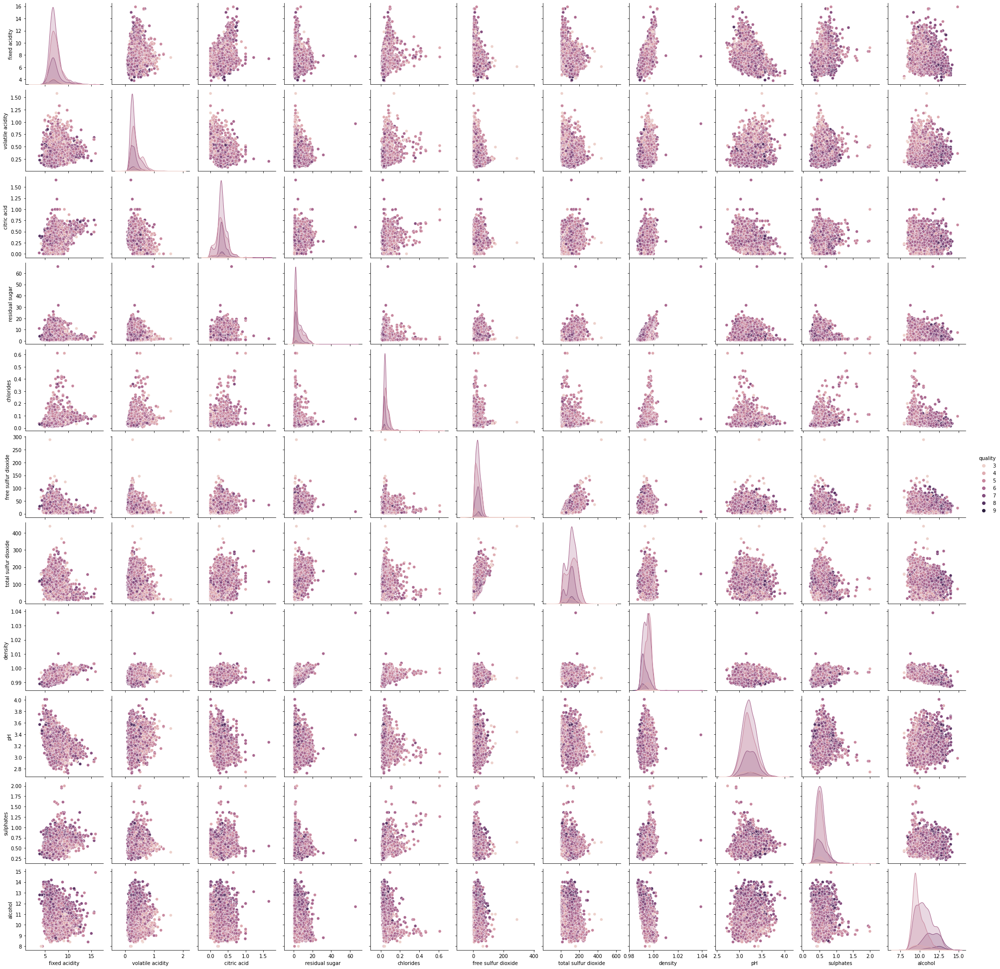

In [708]:
#Grade de gráfico com as relações entre variáveis
sns.pairplot(df_wine, hue = 'quality') #overview dos dados
plt.show()

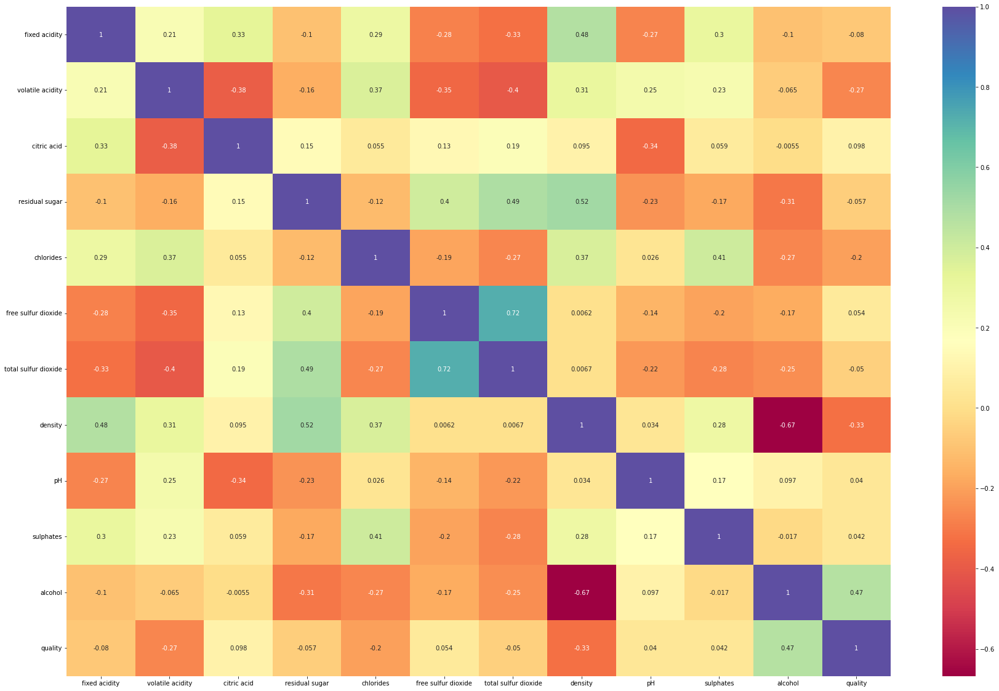

In [709]:
#Para verificar se há correlações entre as feautures e o target. Nele, 1 significa que há uma correlação positiva e -1 negativa.

plt.figure(figsize=(30,20))
cor = df_wine.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Spectral)
plt.show()

Em relação a qualidade, as variáveis com maior correlação no mapa de calor são:
- Álcool (0.469422)

Ainda em relação a qualidade, as variáveis com correlação de forma mais fraca:
- Densidade (-0.326434)
- Cloretos (-0.202137)
- Acidez volátil (-0.265205)

Entre as variáveis das duas bases unidas, as maiores correlações são:
- Açúcar residual e densidade (0.52093) - puxado pela forte relação no vinho branco
- Total de dióxido de enxofre e dióxido de enxofre livre (0.720488)
- Álcool e densidade (-0.667811)

Comparando as correlações entre as análises das bases isoladas e das bases juntas:
- O álcool e qualidade se destaca na correlação com a qualidade;
- Para o vinho tinto a qualidade tem correlação com sulfatos, ácido cítrico e ácido volátil, já no vinho branco com a densidade e cloretos;
- Entre as variáveis do vinho tinto a acidez fixa, acidez volátil, pH e densidade possuem correlação e para o vinho branco essas correlação são mais destacadas para o açúcar residual e densidade. Ambas as bases tem correlação entre o total do dióxido de enxofre e o dióxido de enxofre livre e para densidade e álcool.

In [755]:
df_wine_corr = df_wine.corr()
df_wine_corr[df_wine_corr>0.5]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
volatile acidity,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
citric acid,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
residual sugar,NaN,NaN,NaN,1.00000,NaN,NaN,NaN,0.52093,NaN,NaN,NaN,NaN
chlorides,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
free sulfur dioxide,NaN,NaN,NaN,NaN,NaN,1.000000,0.720488,NaN,NaN,NaN,NaN,NaN
total sulfur dioxide,NaN,NaN,NaN,NaN,NaN,0.720488,1.000000,NaN,NaN,NaN,NaN,NaN
density,NaN,NaN,NaN,0.52093,NaN,NaN,NaN,1.00000,NaN,NaN,NaN,NaN
pH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
sulphates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN


In [756]:
df_wine_corr[df_wine_corr<-0.5]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
volatile acidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
citric acid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
residual sugar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
chlorides,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
free sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
total sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
density,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.667811,NaN
pH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sulphates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:xlabel='quality', ylabel='Count'>

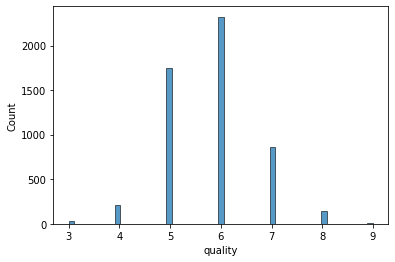

In [757]:
# histograma de quality ja possivel identificar que 5 e 6  tem um numero maior de amostras então o dataset
#esta desbalanceado isso prejudica a precisão da analise

sns.histplot(df_wine['quality'])

In [758]:
df_wine['quality'].value_counts(normalize = True)

6    0.436654
5    0.329323
7    0.160902
4    0.038722
8    0.027820
3    0.005639
9    0.000940
Name: quality, dtype: float64

In [759]:
df_wine.groupby(['quality','color']).mean()

fixed acidity  volatile acidity  citric acid  residual sugar  \
quality color                                                                 
3       red         8.360000          0.884500     0.171000        2.635000   
        white       7.600000          0.333250     0.336000        6.392500   
4       red         7.779245          0.693962     0.174151        2.694340   
        white       7.139869          0.382157     0.305229        4.499346   
5       red         8.171231          0.578596     0.244523        2.509532   
        white       6.921745          0.303306     0.335957        6.941532   
6       red         8.337383          0.496084     0.279364        2.457290   
        white       6.819435          0.261630     0.338227        5.959787   
7       red         8.858683          0.403653     0.371856        2.716766   
        white       6.701089          0.265363     0.327358        4.523875   
8       red         8.441176          0.427647     0.382941        2.576471   
        white       6.609924          0.286794     0.335038        5.056489   
9       white       7.420000          0.298000     0.386000        4.120000   

               chlorides  free sulfur dioxide  total sulfur dioxide   density  \
quality color                                                                   
3       red     0.122500            11.000000             24.900000  0.997464   
        white   0.054300            53.325000            170.600000  0.994884   
4       red     0.090679            12.264151             36.245283  0.996542   
        white   0.050059            23.127451            124.127451  0.994199   
5       red     0.093971            17.161179             57.406412  0.997082   
        white   0.052323            36.002979            150.099574  0.995072   
6       red     0.085075            15.637383             40.816822  0.996565   
        white   0.045178            35.308166            136.460850  0.993722   
7       red     0.076832            13.994012             35.449102  0.996051   
        white   0.037556            33.851234            122.052975  0.992059   
8       red     0.068353            13.764706             34.470588  0.995095   
        white   0.036756            35.618321            122.034351  0.991745   
9       white   0.027400            33.400000            116.000000  0.991460   

                     pH  sulphates    alcohol  
quality color                                  
3       red    3.398000   0.570000   9.955000  
        white  3.187500   0.474500  10.345000  
4       red    3.381509   0.596415  10.265094  
        white  3.185425   0.476667  10.197712  
5       red    3.300815   0.623570   9.888562  
        white  3.171779   0.482621   9.864182  
6       red    3.318000   0.674542  10.658879  
        white  3.196029   0.492355  10.646122  
7       red    3.290060   0.742635  11.491118  
        white  3.228462   0.502859  11.515844  
8       red    3.274118   0.774706  12.158824  
        white  3.235115   0.485878  11.880153  
9       white  3.308000   0.466000  12.180000

Text(0, 0.5, 'Proporção')

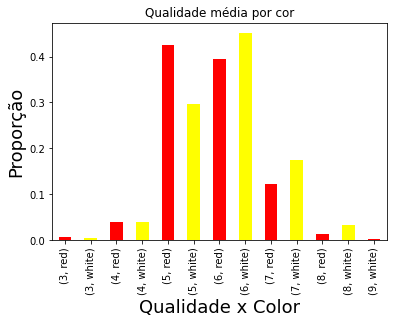

In [761]:
# há mais amostras brancas do que amostras vermelhas.
# Então dividimos a contagem pela contagem total da cor para usar as "proporções"

colors=['red', 'yellow'] 

counts = df_wine.groupby(['quality', 'color']).count()['pH']
total = df_wine.groupby('color').count()['pH']

prop = counts / total
prop.plot(kind='bar', title='Qualidade média por cor', color=colors)

plt.xlabel('Qualidade x Color', fontsize=18) 
plt.ylabel('Proporção', fontsize=18)

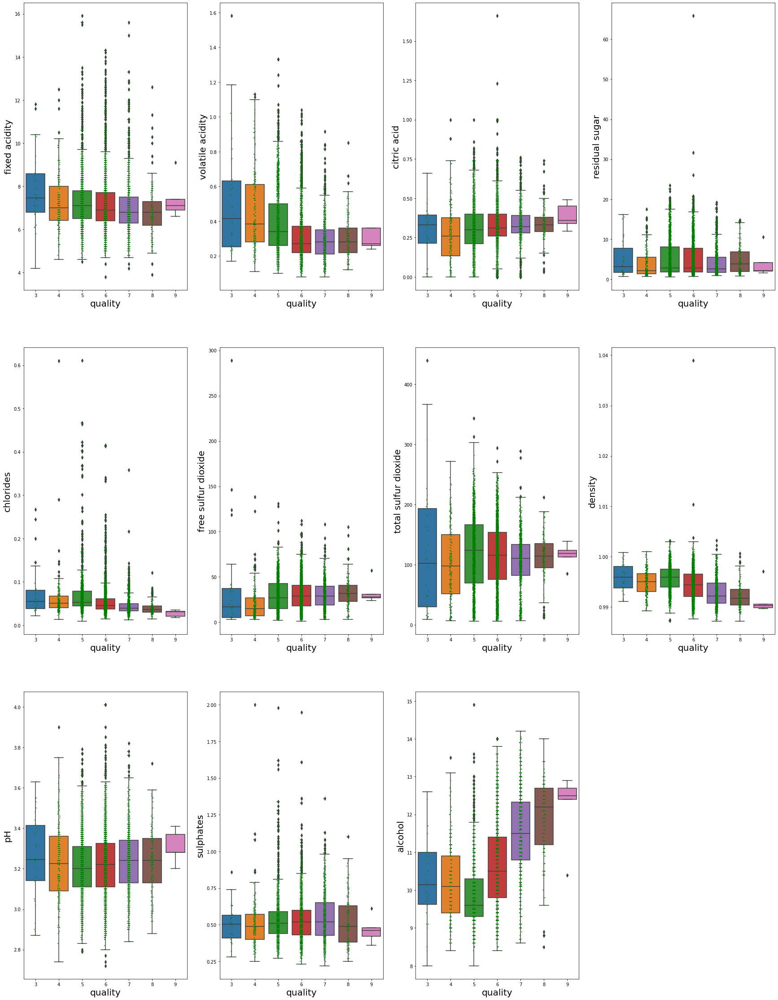

In [763]:
fig = plt.figure(figsize = (30,40)) # width x height
ax1 = fig.add_subplot(3, 4, 1) # row, column, position
ax2 = fig.add_subplot(3, 4, 2)
ax3 = fig.add_subplot(3, 4, 3)
ax4 = fig.add_subplot(3, 4, 4)
ax5 = fig.add_subplot(3, 4, 5)
ax6 = fig.add_subplot(3, 4, 6)
ax7 = fig.add_subplot(3, 4, 7)
ax8 = fig.add_subplot(3, 4, 8)
ax9 = fig.add_subplot(3, 4, 9)
ax10 = fig.add_subplot(3, 4, 10)
ax11 = fig.add_subplot(3, 4, 11)

sns.boxplot(x='quality', y=df_wine['fixed acidity'], data=df_wine, ax=ax1)
sns.stripplot(x='quality', y=df_wine['fixed acidity'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax1)
ax1.xaxis.label.set_size(20)
ax1.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['volatile acidity'], data=df_wine, ax=ax2)
sns.stripplot(x='quality', y=df_wine['volatile acidity'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax2)
ax2.xaxis.label.set_size(20)
ax2.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['citric acid'], data=df_wine, ax=ax3)
sns.stripplot(x='quality', y=df_wine['citric acid'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax3)
ax3.xaxis.label.set_size(20)
ax3.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['residual sugar'], data=df_wine, ax=ax4)
sns.stripplot(x='quality', y=df_wine['residual sugar'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax4)
ax4.xaxis.label.set_size(20)
ax4.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['chlorides'], data=df_wine, ax=ax5)
sns.stripplot(x='quality', y=df_wine['chlorides'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax5)
ax5.xaxis.label.set_size(20)
ax5.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['free sulfur dioxide'], data=df_wine, ax=ax6)
sns.stripplot(x='quality', y=df_wine['free sulfur dioxide'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax6)
ax6.xaxis.label.set_size(20)
ax6.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['total sulfur dioxide'], data=df_wine, ax=ax7)
sns.stripplot(x='quality', y=df_wine['total sulfur dioxide'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax7)
ax7.xaxis.label.set_size(20)
ax7.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['density'], data=df_wine, ax=ax8)
sns.stripplot(x='quality', y=df_wine['density'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax8)
ax8.xaxis.label.set_size(20)
ax8.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['pH'], data=df_wine, ax=ax9)
sns.stripplot(x='quality', y=df_wine['pH'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax9)
ax9.xaxis.label.set_size(20)
ax9.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['sulphates'], data=df_wine, ax=ax10)
sns.stripplot(x='quality', y=df_wine['sulphates'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax10)
ax10.xaxis.label.set_size(20)
ax10.yaxis.label.set_size(20)

sns.boxplot(x='quality', y=df_wine['alcohol'], data=df_wine, ax=ax11)
sns.stripplot(x='quality', y=df_wine['alcohol'], data=df_wine, color="green", jitter=0.05, size=2, ax=ax11)
ax11.xaxis.label.set_size(20)
ax11.yaxis.label.set_size(20)

plt.savefig('boxplot_quality.png', format='png', dpi=100)

<AxesSubplot:xlabel='group_quality', ylabel='count'>

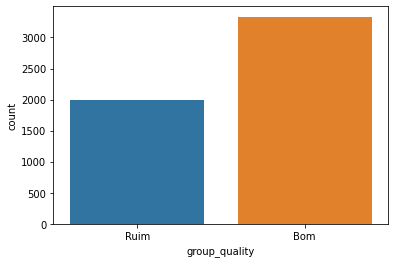

In [765]:
sns.countplot(x='group_quality', data=df_wine)

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1255/1255990.png?w=740&t=st=1651687663~exp=1651688263~hmac=49e6725289d3e2aa6cb72e8ddad32f53197719c9bd8594cd72708fbe608696ae" width="20">
    <font size="+2.5">Modelagem dos Dados - Regressão Linear</font>
</div>

Preparação da base:
- **X :** todos as variáveis são mantidas, exceto a resposta;
- **y :** variável de resposta da base df_wine.

In [803]:
X = df_wine.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = df_wine['quality']

Separação da base em treino e teste:

In [804]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

Os dados possuem diferentes escalas, o que pode influenciar o modelo. Dessa forma é necessário normalizá-los. <br> 
Utilizamos o **Z-Score**.

In [805]:
# Instanciar a normalização
scaler = StandardScaler()

In [806]:
# Aplicação da Normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [807]:
# Instancie a classe do estimador
model = LinearRegression()

In [808]:
# Fit dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
model.fit(X_train_std, y_train) 

LinearRegression()

In [809]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

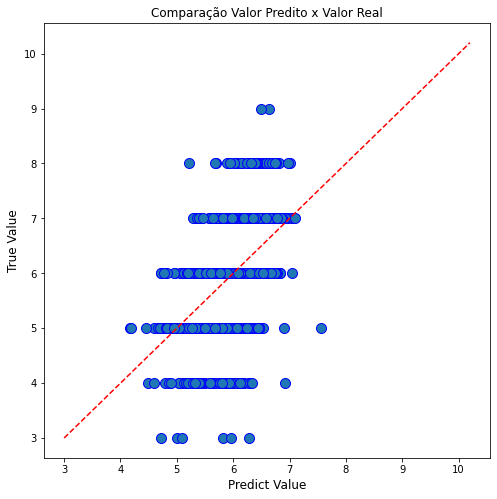

In [810]:
#Gráfico para analisar as distâncias dos valores previstos pelo modelo e dos valores reais
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

O gráfico acima indica que os valores preditos não se ajustam muito bem aos dados reais. Um melhor ajuste seria representado com mais bolinhas azuis sobre a linha tracejada vermelha. 

__Métricas para analisar numericamente o quão ajustado está o modelo:__

In [811]:
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_completo_rw = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_completo_rw = np.sqrt(MSE_linear_completo_rw)

#Calcula o MAE (mean absolute error)
MAE_linear_completo_rw = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_completo_rw = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(RMSE_linear_completo_rw, 3))
print('MSE: ', np.round(MSE_linear_completo_rw, 3))
print('MAE: ', np.round(MAE_linear_completo_rw, 3))
print('R2:  ', np.round(R2_linear_completo_rw, 3))

Métricas: 
RMSE:  0.734
MSE:  0.538
MAE:  0.569
R2:   0.297


<br>

__Feature importance__: avaliando quais variáveis têm maior impacto no modelo

In [812]:
# Coeficientes betas para a regrressão
coefs = model.coef_

In [813]:
# cria algumas listas auxiliares
list_columns = X_train.columns
list_features = []
list_score = []

# loop para vincular o nome da feature com o respectivo coeficiente
for i, v in enumerate(coefs):
    list_features.append(list_columns[i])
    list_score.append(v)

In [814]:
# Cria um dicionario das Features
dictionary = {'Features': list_features,
               'Scores': list_score}

In [815]:
# Criação do DataFrame
df = pd.DataFrame(dictionary)

#ordena os coeficientes
df = df.sort_values(['Scores'], ascending = False)
df

,Features,Scores
10,alcohol,0.330789
3,residual sugar,0.157661
9,sulphates,0.127016
5,free sulfur dioxide,0.113489
8,pH,0.068521
0,fixed acidity,0.057892
2,citric acid,0.025790
4,chlorides,-0.034531
6,total sulfur dioxide,-0.143653
7,density,-0.147676


A ordem de influência das features apresentadas acima comprovou a análise prévia feita das features de forma binária. O álcool é o que possui maior impacto para um vinho ser classificado como bom. A acidez volátil e a densidade possuem influência negativa na pontuação dos vinhos e os cloretos, quando analisados no conjunto, não impactam de maneira significativa, como era esperado pelo heat map.

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/226/226972.png?w=740" width="15">
    <font size="+1.75">Conclusão do modelo de regressão linear</font>
</div>

Assim como nas análises das bases de forma separada, durante a análise exploratória verificamos que as variáveis (features) não tinham uma forte tendência linear quando analisadas individualmente em relação a qualidade (vide prévia no pairplot e mapa de calor de correlação), ou seja, a regressão linear provavelmente não seria o melhor modelo para representar a influência dessas variáveis na qualidade do vinho.<br><br>
O gráfico de y predito e y real mostra que a maioria dos dados não fica distribuido sobre ou em torno da reta proposta pelo modelo, não possuindo uma característica do x crescer proporcionalmente (ou inversamente proporcional) ao y.<br>
O resultado de R2 confirma que a relação entre as features e a qualidade pode não ser linear. O R2 indica que apenas 30% dos dados ficam bem ajustados a reta proposta pelo modelo, ou seja, a maior parte dos dados não esta reprensentada e, por isso, provavelmente teríamos uma baixa taxa de acerto quando utilizássemos este modelo para prever a qualidade de novos vinhos dados os parâmetros presentes no dataset.

<br>

### Modelagem dos Dados - Regressão Linear - Somentes das variaveis (volatile acidity, residual sugar, free sulfur dioxide, total sulfur dioxide, density, sulphates e alcohol)

In [1216]:
df_wine.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'group_quality', 'color'],
      dtype='object')

In [1229]:
#Separando a variável resposta da base
X = df_wine.select_dtypes(include = [np.number]).drop(['fixed acidity',
                                                       'citric acid',
                                                       'chlorides',
                                                       'pH',
                                                       'quality'], axis = 1)
y = df_wine['quality']

In [1230]:
#Criando as bases de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [1231]:
#Instanciando a classe para realizar a normalização dos dados
scaler = StandardScaler()

In [1232]:
#Normalizando
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [1233]:
#Instanciando o modelo
model = LinearRegression()

In [1234]:
#Fit dos dados
model.fit(X_train_std, y_train)

LinearRegression()

In [1235]:
#Predict
y_pred = model.predict(X_test_std)

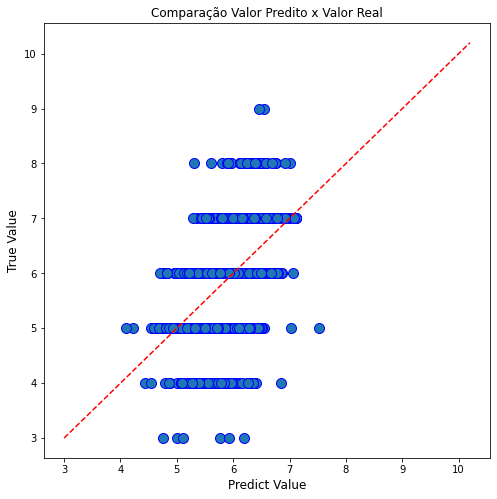

In [1236]:
#Gráfico de comparação y predito e real
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [1237]:
#Métricas de avaliação do modelo
#Calcula o MSE (mean squared error) - erro médio quadrático
MSE_linear_seven_rw = mean_squared_error(y_test, y_pred)

#Calcula o RMSE (root mean squared error) - raiz do erro médio quadrátivo
RMSE_linear_seven_rw = np.sqrt(MSE_linear_seven_rw)

#Calcula o MAE (mean absolute error)
MAE_linear_seven_rw = mean_absolute_error(y_test, y_pred)

# Calcula o R2 score
R2_linear_seven_rw = r2_score(y_test, y_pred)

# Print das métricas
print('Métricas: ')
print('RMSE: ', np.round(MSE_linear_seven_rw, 3))
print('MSE: ', np.round(MSE_linear_seven_rw, 3))
print('MAE: ', np.round(MAE_linear_seven_rw, 3))
print('R2:  ', np.round(R2_linear_seven_rw, 3))

Métricas: 
RMSE:  0.544
MSE:  0.544
MAE:  0.574
R2:   0.289


<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/226/226972.png?w=740" width="15">
    <font size="+1.75">Conclusão do modelo de regressão linear com as variáveis selecionadas</font>
</div>

Assim como para as análises separadas, a retirada das variáveis que exercem menos influência na qualidade melhorou o modelo, porém não significativamente.

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/1255/1255990.png?w=740&t=st=1651687663~exp=1651688263~hmac=49e6725289d3e2aa6cb72e8ddad32f53197719c9bd8594cd72708fbe608696ae" width="20">
    <font size="+2.5">Modelagem dos Dados - Regressão Logística</font>
</div>

In [929]:
# Separação da base e da variável resposta
X = df_wine.select_dtypes(include = [np.number]).drop(['quality'], axis = 1)
y = df_wine['group_quality']

In [930]:
df_wine['group_quality'].value_counts(normalize = True)

Bom     0.626316
Ruim    0.373684
Name: group_quality, dtype: float64

Base desbalanceada, necessário fazer a estratificação.

In [932]:
# Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    stratify = y,
                                                    random_state = 42)

In [933]:
# Instanciar a normalização
scaler = StandardScaler()

In [934]:
# Aplicação da Normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [935]:
#Instanciando o modelo
model = LogisticRegression()

In [936]:
#Treinando o modelo
model.fit(X_train_std,y_train)

LogisticRegression()

In [937]:
# Predict do Modelo
y_pred = model.predict(X_test_std)

In [938]:
# Calculo das probabilidades de cada uma das classes
y_proba = model.predict_proba(X_test_std)

<br>

Avaliação do modelo utilizando a **matriz de confusão**.

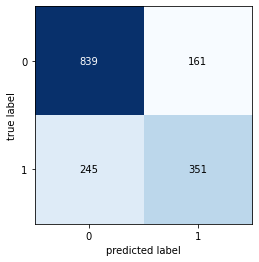

In [939]:
#Criação da matriz de confusão
cm_completo_rw = confusion_matrix(y_test, y_pred)
cm_completo_rw

# Plote da Matriz de Confusão
plot_confusion_matrix(cm_completo_rw)
plt.show()

In [940]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         Bom       0.77      0.84      0.81      1000
        Ruim       0.69      0.59      0.63       596

    accuracy                           0.75      1596
   macro avg       0.73      0.71      0.72      1596
weighted avg       0.74      0.75      0.74      1596



In [941]:
print(accuracy_score(y_test, y_pred))

0.7456140350877193


C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaconda3\lib\site-packages\seaborn\distributions.py:1718: UserWarning:

`shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.

C:\Users\maeba\anaco

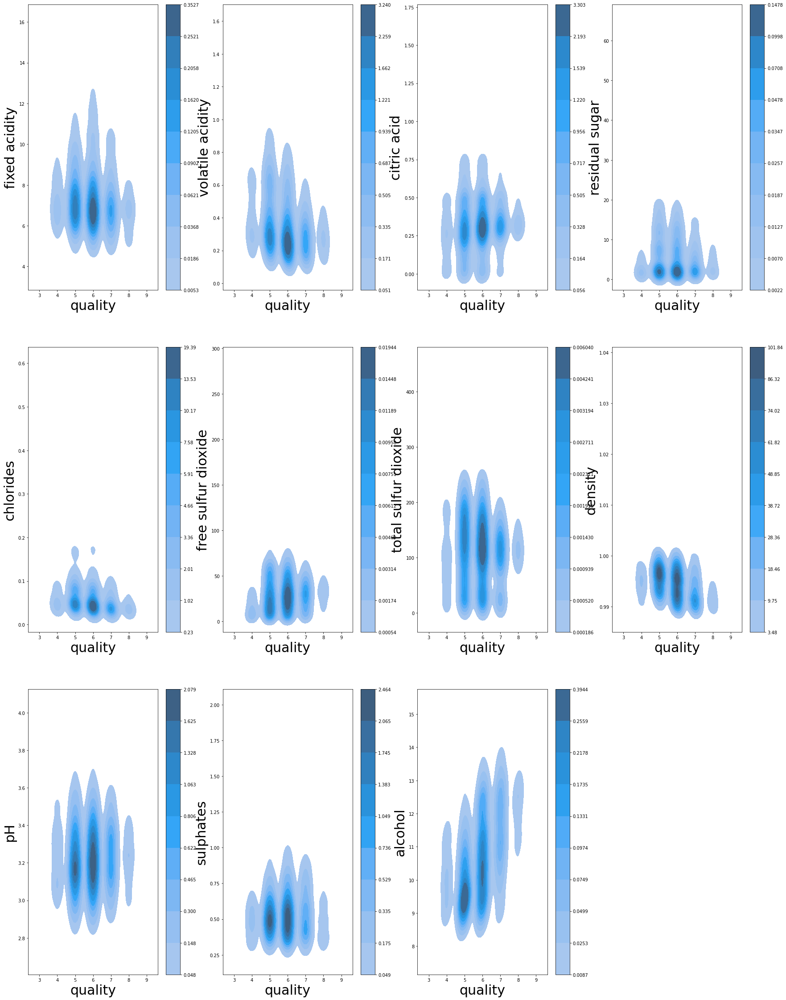

In [827]:
fig = plt.figure(figsize = (30,40)) 
ax1 = fig.add_subplot(3, 4, 1) 
ax2 = fig.add_subplot(3, 4, 2)
ax3 = fig.add_subplot(3, 4, 3)
ax4 = fig.add_subplot(3, 4, 4)
ax5 = fig.add_subplot(3, 4, 5)
ax6 = fig.add_subplot(3, 4, 6)
ax7 = fig.add_subplot(3, 4, 7)
ax8 = fig.add_subplot(3, 4, 8)
ax9 = fig.add_subplot(3, 4, 9)
ax10 = fig.add_subplot(3, 4, 10)
ax11 = fig.add_subplot(3, 4, 11)

sns.kdeplot(x='quality', y=df_wine['fixed acidity'], data=df_wine, ax=ax1, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['volatile acidity'], data=df_wine, ax=ax2, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['citric acid'], data=df_wine, ax=ax3, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['residual sugar'], data=df_wine, ax=ax4, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['chlorides'], data=df_wine, ax=ax5, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['free sulfur dioxide'], data=df_wine, ax=ax6, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['total sulfur dioxide'], data=df_wine, ax=ax7, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['density'], data=df_wine, ax=ax8, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['pH'], data=df_wine, ax=ax9, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['sulphates'], data=df_wine, ax=ax10, shade=True, shade_lowest = False, cbar=True)
sns.kdeplot(x='quality', y=df_wine['alcohol'], data=df_wine, ax=ax11, shade=True, shade_lowest = False, cbar=True)
ax1.xaxis.label.set_size(30)
ax1.yaxis.label.set_size(30)
ax2.xaxis.label.set_size(30)
ax2.yaxis.label.set_size(30)
ax3.xaxis.label.set_size(30)
ax3.yaxis.label.set_size(30)
ax4.xaxis.label.set_size(30)
ax4.yaxis.label.set_size(30)
ax5.xaxis.label.set_size(30)
ax5.yaxis.label.set_size(30)
ax6.xaxis.label.set_size(30)
ax6.yaxis.label.set_size(30)
ax7.xaxis.label.set_size(30)
ax7.yaxis.label.set_size(30)
ax8.xaxis.label.set_size(30)
ax8.yaxis.label.set_size(30)
ax9.xaxis.label.set_size(30)
ax9.yaxis.label.set_size(30)
ax10.xaxis.label.set_size(30)
ax10.yaxis.label.set_size(30)
ax11.xaxis.label.set_size(30)
ax11.yaxis.label.set_size(30)

<br>

<br>

### Modelagem dos Dados - Regressão Logística - Somentes das variaveis (volatile acidity, residual sugar, free sulfur dioxide, total sulfur dioxide, density, sulphates e alcohol)

In [1239]:
#Separação da base da variável resposta - mantendo as variáveis com maior influência para avaliação do modelo
X = df_wine.select_dtypes(include = [np.number]).drop(['fixed acidity',
                                                       'citric acid',
                                                       'chlorides',
                                                       'pH',
                                                       'quality'], axis = 1)


y = df_wine['group_quality']

In [1240]:
# Separação da base em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    stratify = y,
                                                    random_state = 42)

In [1241]:
# Instanciar a normalização
scaler = StandardScaler()

In [1242]:
# Aplicação da Normalização
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [1243]:
#Instanciando o modelo
model_2 = LogisticRegression()

In [1244]:
#Treinando o modelo
model_2.fit(X_train_std,y_train)

LogisticRegression()

In [1245]:
# Predict do Modelo
y_pred = model_2.predict(X_test_std)

In [1246]:
# Calculo das probabilidades de cada uma das classes
y_proba = model_2.predict_proba(X_test_std)

<br>

Avaliação do modelo utilizando a **matriz de confusão**.

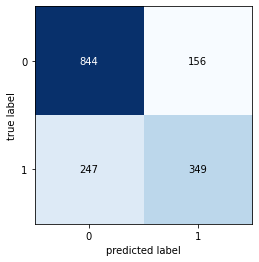

In [1247]:
#Criação da matriz de confusão
cm_six_rw = confusion_matrix(y_test, y_pred)
cm_six_rw

# Plote da Matriz de Confusão
plot_confusion_matrix(cm_six_rw)
plt.show()

In [1248]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         Bom       0.77      0.84      0.81      1000
        Ruim       0.69      0.59      0.63       596

    accuracy                           0.75      1596
   macro avg       0.73      0.71      0.72      1596
weighted avg       0.74      0.75      0.74      1596



In [1249]:
print(accuracy_score(y_test, y_pred))

0.7474937343358395


<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/226/226972.png?w=740" width="15">
    <font size="+1.75">Conclusão do modelo de regressão logística</font>
</div>

__Acurácia__: 74,5%, ou seja, o modelo acertou 74,5% das classificações (considerando a classificação como vinho bom ou ruim). <br>
__Precisão__: 77% - Bom, ou seja, de todas as classificações positivas, 77% estavam corretas. <br>
__Recall__: 84% - Bom, ou seja, de todos os vinhos classificados como bons, o modelo acertou 84%. <br>

Como estamos trabalhando com classicação de vinhos, os valores verdadeiros são mais importantes do que os erros, dessa forma uma acurácia de 76,4% representa um bom modelo.

O resultado encontrado pode ter relação com o volume de dados não muito grande e o número de outliers nos registros.<br>

A retirada das variáveis com menos influência na qualidade não impactou o modelo.

<br>

<div>
    <img src="https://cdn-icons-png.flaticon.com/512/226/226972.png?w=740" width="35">
    <font size="+3.5">Conclusão do projeto</font>
</div>

Este projeto analisou bases de dados dos vinhos tintos, vinhos brancos e uma terceira avaliação com as bases unidas. Em cada análise foram utilizados os modelos de regressão linear e regressão logística.<br><br>

As bases são compostas de resultados físico-químicos e de uma nota de qualidade para cada vinho.<br><br>

Na primeira parte foi realizada uma limpeza nos dados. Houve a exclusão de dados duplicados já possivelmente não teríamos dados físico-químicos exatamente iguais para vinhos diferentes.<br>
Também foram avaliados os outliers de cada variável. Num primeiro momento optou-se pela não remoção por não haver dados muito discrepantes, pequeno volume de dados e limitações de conhecimentos técnicos sobre vinho impedirem um julgamento mais profundo. Quanto ao volume de dados, a remoção de registros de forma desnecessária poderia fornecer menor diversidade ao modelo que deixaria de analisar cenários existentes.<br><br>

Durante a análise exploratória os dados aparentemente não tinham forte correlação linear, mas algumas variáveis se destacavam em relação a influência na qualidade (detalhadas mais abaixo).<br><br>

A última etapa foi a aplicação dos modelos de regressão linear e regressão logística.<br>
Os resultados de regressão linear confirmaram o que tinha sido percebido na EDA para todos os conjuntos de dados: __a relação entre as features e a qualidade não é linear__. Os resultados foram comprovados através do R-Score que ficou sempre abaixo de 40%. E os gráficos também demonstraram o __underfitting__.<br>
Com o objetivo de retirar possíveis interferências e observar sobre outros pontos de vista, para o dataset de vinhos tintos os modelos de regressão linear foram aplicados de forma binária entre as variáveis (variável + qualidade) e também considerando um conjunto das variáveis com maior influência. Todos os resultados corroboraram para a conclusão da baixa correlação linear entre as variáveis e a qualidade.<br>
Outra avaliação foi realizada com a retirada de alguns outliers. Para evitar diminuir a base de dados, a escolha dos registros que foram removidos levou em consideração o número de outliers em um mesmo registro. Dessa forma o número de dados diferentes foi minimizado, porém os resultados do modelo não melhoraram de forma significativa.<br><br>

Quanto a aplicação da __regressão logística__ a base foi dividida entre vinhos bons e vinhos ruins. Este modelo apresentou melhor performance, com __acurácia entre 70 e 80%__. Dado o objetivo de classificação de vinhos, esta acurácia parece ser um bom resultado.
Tentativas de melhorar o modelo através da manutenção de variáveis mais influentes não apresentou melhora dos resultados.<br><br>

Em relação as diferenças entre as bases, o vinho tinto possui variáveis influentes na qualidade um pouco diferentes do vinho branco. Por esse motivo, na junção dos datasets, as variáveis que impactaram foram uma mescla da importância nos datasets individuais.<br>
A aplicação dos modelos trouxe resultados muito próximos para as três bases.<br>

Abaixo seguem as variáveis mais influentes para cada tipo de base:
- Vinho tinto: álcool, sulfato, pH, dióxido de enxofre total, acidez volátil;
- Vinho branco: álcool, açúcar residual, pH, acidez volátil e densidade;
- Bases unidas: álcool, açúcar residual, sulfatos, dióxido de enxofre livre, total de dióxido de enxofre, densidade e acidez volátil.<br><br>

__Portanto os modelos de regressão linear, mesmo com variações, não responderiam de maneira assertiva a nota de vinhos novos. Dessa forma a taxa de notas corretas não seria muito alta.
Já o modelo de regressão logística conseguiria identificar vinhos bons e ruins com boa taxa de acerto.__